# Segmentation Result Exploration and Preprocessing for Model Training
### Explore depth of Mask
It's important to bear in mind that the depth of the raw scan does not mean that the lung can be seen in all the slices. Therefore, we need to explore the depth of the mask to determine where the lung is visible. 

In [1]:
import pandas as pd
import numpy as np
from multiprocessing import Pool, cpu_count
import nibabel as nib
import matplotlib.pyplot as plt
import torch

In [2]:
cases_df = pd.read_csv('collected_cases.csv')  
patient_IDs = cases_df['PatientID'].tolist()

In [8]:
len(patient_IDs)

575

In [9]:
def depth_scans(patient):
    path = cases_df[cases_df['PatientID'] == patient]['Image'].values[0]
    scan = nib.load(path).get_fdata()
    return np.shape(scan)[0]
def depth_nonzero_masks(patient):
    path = cases_df[cases_df['PatientID'] == patient]['Mask'].values[0]
    mask = nib.load(path).get_fdata()
    return np.count_nonzero(np.sum(mask, axis=(1, 2)))

In [10]:
def process_patient_depths(patient):
    image_path = cases_df[cases_df['PatientID'] == patient]['Image'].values[0]
    mask_path = cases_df[cases_df['PatientID'] == patient]['Mask'].values[0]
    
    scan = nib.load(image_path).get_fdata()
    mask = nib.load(mask_path).get_fdata()
    
    depth = scan.shape[0]
    width = scan.shape[1]
    height = scan.shape[2]

    nonzero_depth = np.count_nonzero(np.sum(mask, axis=(1, 2)))
    nonzero_width = np.count_nonzero(np.sum(mask, axis=(0, 2)))
    nonzero_height = np.count_nonzero(np.sum(mask, axis=(1, 0)))
    
    return patient, depth, width, height, nonzero_depth, nonzero_width, nonzero_height

num_workers = min(cpu_count(), 8)  # Limit to 8 workers to avoid overloading
with Pool(num_workers) as pool:
    results = pool.map(process_patient_depths, patient_IDs)

for patient, depth,  width, height, nonzero_depth, nonzero_width, nonzero_height in results:
    idx = cases_df[cases_df['PatientID'] == patient].index[0]
    cases_df.loc[idx, 'Depth'] = depth
    cases_df.loc[idx, 'Width'] = width
    cases_df.loc[idx, 'Height'] = height
    cases_df.loc[idx, 'NonzeroDepth'] = nonzero_depth
    cases_df.loc[idx, 'NonzeroWidth'] = nonzero_width
    cases_df.loc[idx, 'NonzeroHeight'] = nonzero_height

In [ ]:
# Save the updated DataFrame to a new CSV file
#cases_df.to_csv('collected_cases_with_depths.csv', index=False)

### Visualize Mask Depth, Width, and Height total and non-zero (only lung region)

In [3]:
cases_df = pd.read_csv('collected_cases_with_depths.csv')

In [13]:
cases_df

,PatientID,BaselineDate,SeriesUID,Image,Mask,Followup FVC Predicted %,Baseline FVC Predicted %,Baseline SeriesInstanceUID,Depth,Width,Height,NonzeroDepth,NonzeroWidth,NonzeroHeight
0,1001326,1971-01-01,1.2.826.0.1.3680043.10.1218.729327262603124254...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,94.70,95.7,1.2.826.0.1.3680043.10.1218.729327262603124254...,983.0,512.0,512.0,591.0,229.0,276.0
1,298078,1967-10-09,1.2.392.200036.9116.2.6.1.3268.2047398422.1539...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,118.10,96.7,1.2.392.200036.9116.2.6.1.3268.2047398422.1539...,396.0,512.0,512.0,254.0,226.0,377.0
2,727988,1970-10-05,1.2.392.200036.9116.2.6.1.3268.2047398422.1581...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,68.40,75.8,1.2.392.200036.9116.2.6.1.3268.2047398422.1581...,376.0,512.0,512.0,235.0,272.0,395.0
3,1001092,1980-01-01,1.2.826.0.1.3680043.10.1218.114401689482668046...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,88.03,88.3,1.2.826.0.1.3680043.10.1218.114401689482668046...,290.0,512.0,512.0,204.0,311.0,446.0
4,772512,1973-10-01,1.2.392.200036.9116.2.6.1.3268.2047398422.1563...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,77.20,73.9,1.2.392.200036.9116.2.6.1.3268.2047398422.1563...,396.0,512.0,512.0,256.0,234.0,377.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,884616,1973-10-01,1.2.840.113704.1.111.5736.1296042285.14,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,84.00,88.0,1.2.840.113704.1.111.5736.1296042285.14,586.0,512.0,512.0,388.0,261.0,337.0
571,1000939,1966-01-01,1.2.826.0.1.3680043.10.1218.108959920576339993...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,93.40,96.8,1.2.826.0.1.3680043.10.1218.108959920576339993...,893.0,512.0,512.0,648.0,236.0,284.0
572,583963,1968-10-07,1.3.46.670589.33.1.63665194667176200700002.480...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,59.00,66.0,1.3.46.670589.33.1.63665194667176200700002.480...,458.0,512.0,512.0,386.0,293.0,376.0
573,1000731,1975-01-01,1.2.826.0.1.3680043.10.1218.505692788176939779...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,84.60,84.0,1.2.826.0.1.3680043.10.1218.505692788176939779...,1001.0,512.0,512.0,600.0,295.0,401.0


In [4]:
plt.rcParams.update({
    "font.family": "serif",      # serif to match LaTeX article style
    "font.size": 18,
    "axes.titlesize": 18,
    "axes.labelsize": 18,
    "legend.fontsize": 18,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
})

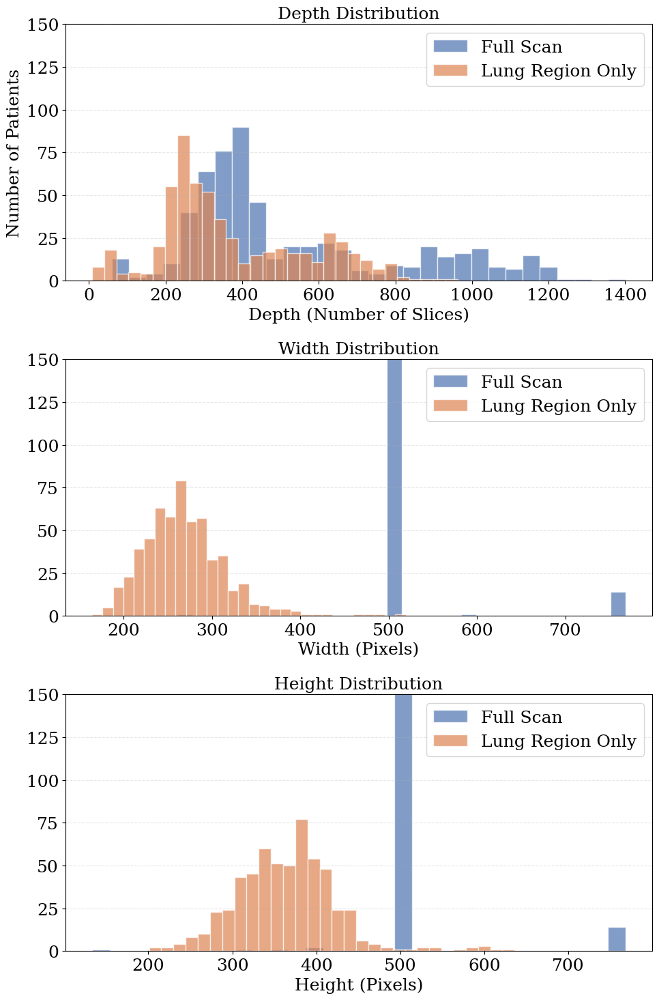

In [5]:
# Compare full scan size vs lung-region size in one 1x3 subplot figure
fig, axes = plt.subplots(3, 1, figsize=(10, 15), sharey=True)

plot_specs = [
    ("Depth", "NonzeroDepth", "Depth (Number of Slices)", "Depth Distribution"),
    ("Width", "NonzeroWidth", "Width (Pixels)", "Width Distribution"),
    ("Height", "NonzeroHeight", "Height (Pixels)", "Height Distribution"),
]

for ax, (full_col, lung_col, x_label, title) in zip(axes, plot_specs):
    ax.hist(cases_df[full_col], bins=30, alpha=0.7, label="Full Scan", color="#4C72B0", edgecolor='white')
    ax.hist(cases_df[lung_col], bins=30, alpha=0.7, label="Lung Region Only", color="#DD8452", edgecolor='white')
    ax.set_xlabel(x_label)
    ax.set_title(title)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.legend()
    ax.set_ylim(0, 150)  

axes[0].set_ylabel("Number of Patients")
#plt.suptitle("Comparison of Full Scan Dimensions vs Lung-Region Dimensions", y=1.03)
plt.tight_layout()
plt.savefig("figures/scan_vs_lung_region_dimensions.png", dpi=300, bbox_inches="tight")
plt.show()

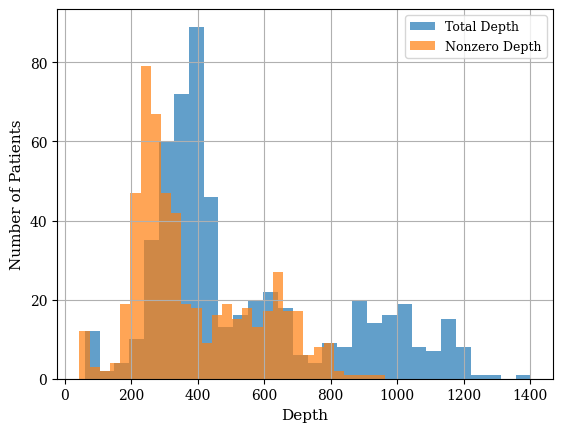

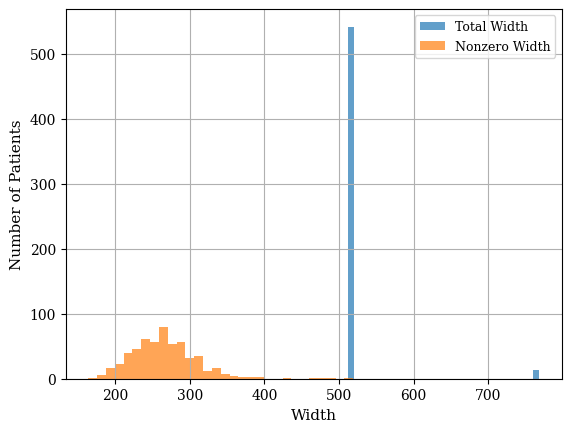

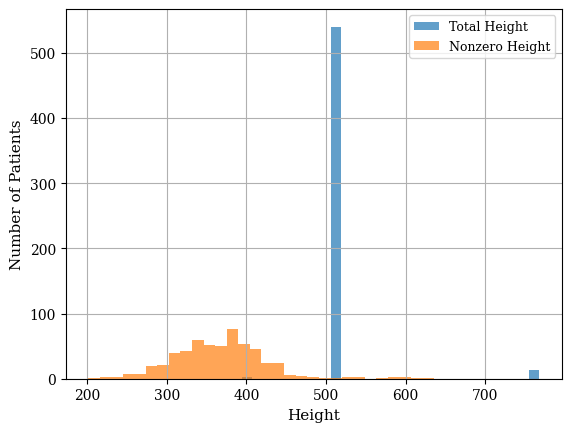

In [19]:
# Histogram of depths

plt.hist(cases_df['Depth'], bins=30, alpha=0.7, label='Total Depth')
plt.hist(cases_df['NonzeroDepth'], bins=30, alpha=0.7, label='Nonzero Depth')
plt.xlabel('Depth')
plt.ylabel('Number of Patients')
plt.legend()
plt.grid()
#plt.savefig('depth_histogram.png')  
plt.show()

# Histogram of widths

plt.hist(cases_df['Width'], bins=30, alpha=0.7, label='Total Width')
plt.hist(cases_df['NonzeroWidth'], bins=30, alpha=0.7, label='Nonzero Width')
plt.xlabel('Width')
plt.ylabel('Number of Patients')
plt.legend()
plt.grid()
#plt.savefig('width_histogram.png')  
plt.show()  

# Histogram of heights  
plt.hist(cases_df['Height'], bins=30, alpha=0.7, label='Total Height')
plt.hist(cases_df['NonzeroHeight'], bins=30, alpha=0.7, label='Nonzero Height')
plt.xlabel('Height')
plt.ylabel('Number of Patients')
plt.legend()
plt.grid()
#plt.savefig('height_histogram.png')  
plt.show()

### Depth Analysis and Percentage Calculation

The depth analysis compares the total scan depth with the actual depth where lung tissue is visible:

- **Total Depth**: Complete depth of the CT scan volume
- **Non-Zero Depth**: Number of slices where lung tissue is present (mask > 0)

The percentage of slices containing lung tissue is calculated using:

$$\text{Percent Lung Slices} = \frac{\text{Non-Zero Depth}}{\text{Total Depth}} \times 100$$

This metric helps identify scans with insufficient lung coverage, which may indicate segmentation issues or anatomical variations that require special handling during preprocessing.

In [6]:
## percent of slices with lungs
cases_df['PercentLungSlices'] = cases_df['NonzeroDepth'] / cases_df['Depth'] * 100

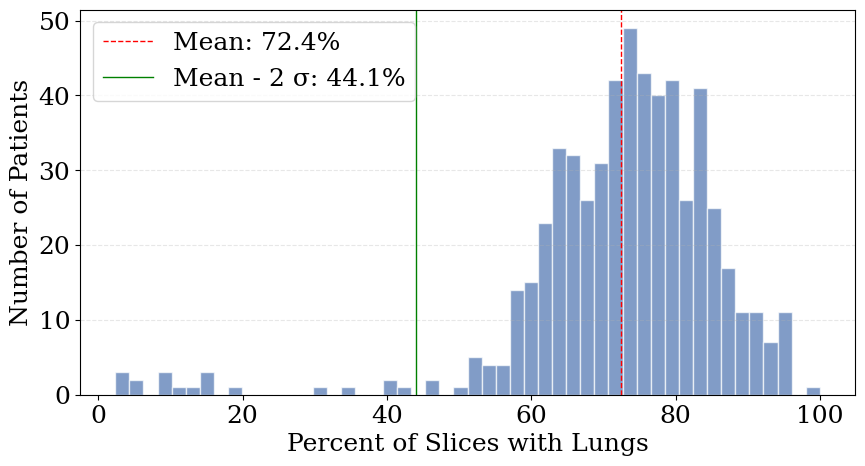

In [7]:
plt.figure(figsize=(10, 5))
plt.hist(cases_df['PercentLungSlices'], bins=50, alpha=0.7, color="#4C72B0", edgecolor='white')

mean_percent = cases_df['PercentLungSlices'].mean()
plt.axvline(mean_percent, color="red", linestyle='--', linewidth=1, label=f'Mean: {mean_percent:.1f}%')

#add line at 2*std 
std_percent = cases_df['PercentLungSlices'].std()
#plt.axvline(mean_percent + 2*std_percent, color="green", linestyle='--', linewidth=1, label=f'Mean + 2*STD: {mean_percent + 2*std_percent:.1f}%')
plt.axvline(mean_percent - 2*std_percent, color="green", linestyle='-', linewidth=1, label=f'Mean - 2 \u03C3: {mean_percent - 2*std_percent:.1f}%')
# only y grid line
plt.grid(axis='y', alpha=0.3, linestyle='--')


plt.xlabel('Percent of Slices with Lungs')
plt.ylabel('Number of Patients')
#save high resolution version of the plot
plt.legend()
plt.savefig('percent_lung_slices_histogram.png', dpi=300)
#plt.grid()
plt.show()

In [8]:
std_percent = cases_df['PercentLungSlices'].std()
print(f'Mean Percent of Lung Slices: {mean_percent:.2f}%')
print(f'Standard Deviation of Percent of Lung Slices: {std_percent:.2f}%')
print(mean_percent-2*std_percent, mean_percent+2*std_percent )


Mean Percent of Lung Slices: 72.45%
Standard Deviation of Percent of Lung Slices: 14.19%
44.05868484713827 100.83588860238552


### Identify outliers based on Lung Depth Percentage
If we assume the distribution of lung depth percentages is approximately normal, we can identify outliers using the mean and standard deviation. 

In [10]:
def mean_nonzero_scan(patient_id):
    mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
    mask_scan = nib.load(mask_nifty_path).get_fdata()
    non_zero_pixels_per_slice = [np.sum(mask_scan[i,:,:] > 0) for i in range(mask_scan.shape[0])]
    
    # Find mean position of non-zero slices
    non_zero_indices = [i for i, val in enumerate(non_zero_pixels_per_slice) if val > 0]
    if non_zero_indices:  # Only if there are non-zero slices
        mean_position = np.mean(non_zero_indices)
        return mean_position
    return None

In [11]:
# compute mean nonzero slice positions
num_workers = min(cpu_count(), 8)  # Limit to 8 workers to avoid overloading
with Pool(num_workers) as pool:
    mean_positions = pool.map(mean_nonzero_scan, patient_IDs)
cases_df['MeanNonzeroSlicePosition'] = mean_positions

In [11]:
#cases_df.to_csv('collected_cases_with_depths.csv', index=False)

In [23]:
cases_df = pd.read_csv('collected_cases_with_depths.csv')

In [12]:
Patient_small = cases_df[cases_df['PercentLungSlices'] < 41]['PatientID'].tolist()
list_outlier = [1000986,1000641,1000658,1001215,1001138,1002744,1001629,1001244,1001117,1001137,1002427, 1000985,1001198, 1002407, 1000635, 1001029, 1001115]
list_outlier_corected = [pid for pid in list_outlier if pid not in [1000658, 1001138]]
intersection = set(Patient_small).intersection(set(list_outlier))
print("Number of patients with less than 45% lung slices:", len(Patient_small))
print("Outlier Patient IDs with less than 45% lung slices:", intersection)
print("Total number of outlier patients identified:", len(list_outlier))
print(f'Patients with less than 45% lung slices not in the outlier list: {set(Patient_small)-set(list_outlier)}')
print(f'Outlier patients with more than 45% lung slices: {set(list_outlier)-set(Patient_small)}')
outlier_more_than_45 = [pid for pid in list_outlier if pid not in Patient_small]
patient_small_without_outliers = [pid for pid in Patient_small if pid not in list_outlier]
outlier_and_small_df = cases_df[cases_df['PatientID'].isin(outlier_more_than_45 + patient_small_without_outliers)]

Number of patients with less than 45% lung slices: 18
Outlier Patient IDs with less than 45% lung slices: {1000641, 1001029, 1002407, 1001198, 1001137, 1002744, 1000985, 1000986, 1000635, 1001244, 1001115, 1001215}
Total number of outlier patients identified: 17
Patients with less than 45% lung slices not in the outlier list: {1001026, 1001127, 1000688, 408817, 1000982, 1000638}
Outlier patients with more than 45% lung slices: {1000658, 1001138, 1001629, 1002427, 1001117}


In [13]:
Patient_small_clean = cases_df[cases_df['PercentLungSlices'] < 60]['PatientID'].tolist()[28:35]
Patient_small_clean


[823895, 1001096, 1000567, 1000861, 1001014, 1000702, 1000699]

In [14]:
def plot_nonzero_pixels_by_patients(patient_list, title_suffix=""):
    """
    Plot non-zero pixels per slice for a list of patients
    
    Args:
        patient_list: List of patient IDs to plot
        title_suffix: Additional text to add to the plot title
    """
    plt.figure(figsize=(15, 10))
    
    for patient_id in patient_list:
        # Get mask path for this patient
        mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
        mask_scan = nib.load(mask_nifty_path).get_fdata()
        
        # Calculate non-zero pixels per slice
        non_zero_pixels_per_slice = [np.sum(mask_scan[i,:,:] > 0) for i in range(mask_scan.shape[0])]
        
        plt.plot(non_zero_pixels_per_slice, label=f'Patient {patient_id}')
    
    plt.xlabel('Slice Depth')
    plt.ylabel('Number of Non-Zero Pixels')
    plt.title(f'Non-Zero Pixels per Slice in Mask{title_suffix}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

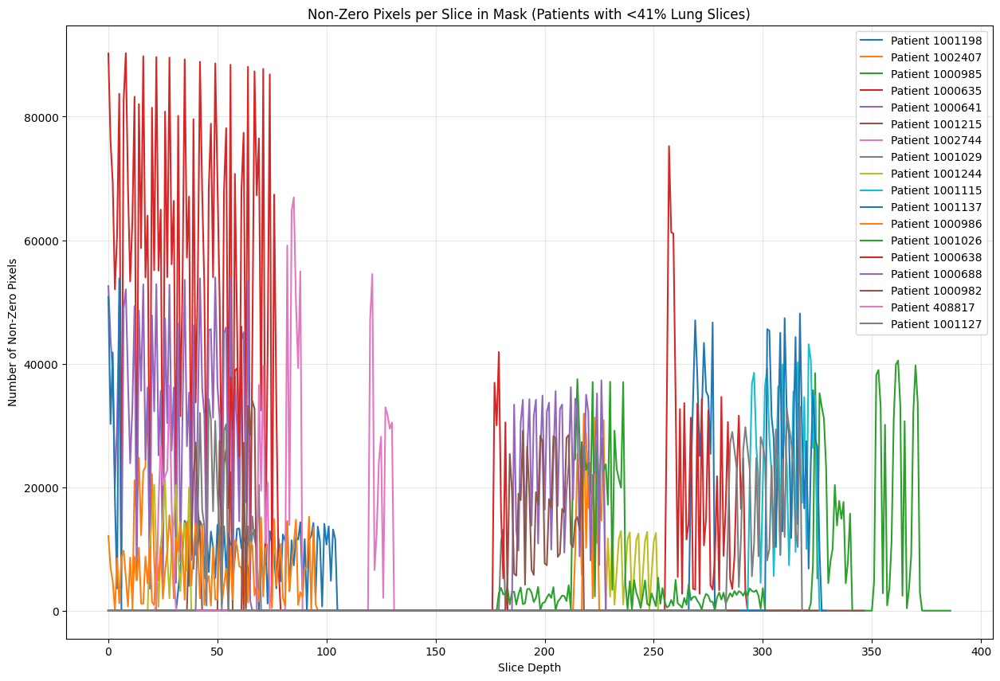

In [6]:
plot_nonzero_pixels_by_patients(Patient_small, title_suffix=" (Patients with <41% Lung Slices)")

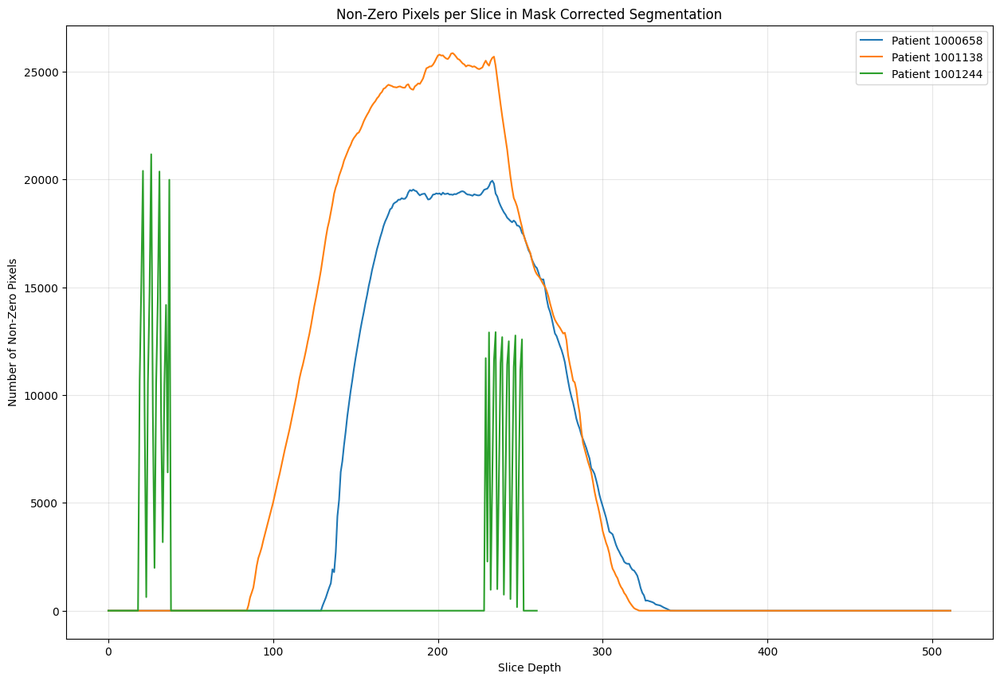

In [16]:
plot_nonzero_pixels_by_patients([1000658,1001138, 1001244], title_suffix=" Corrected Segmentation")

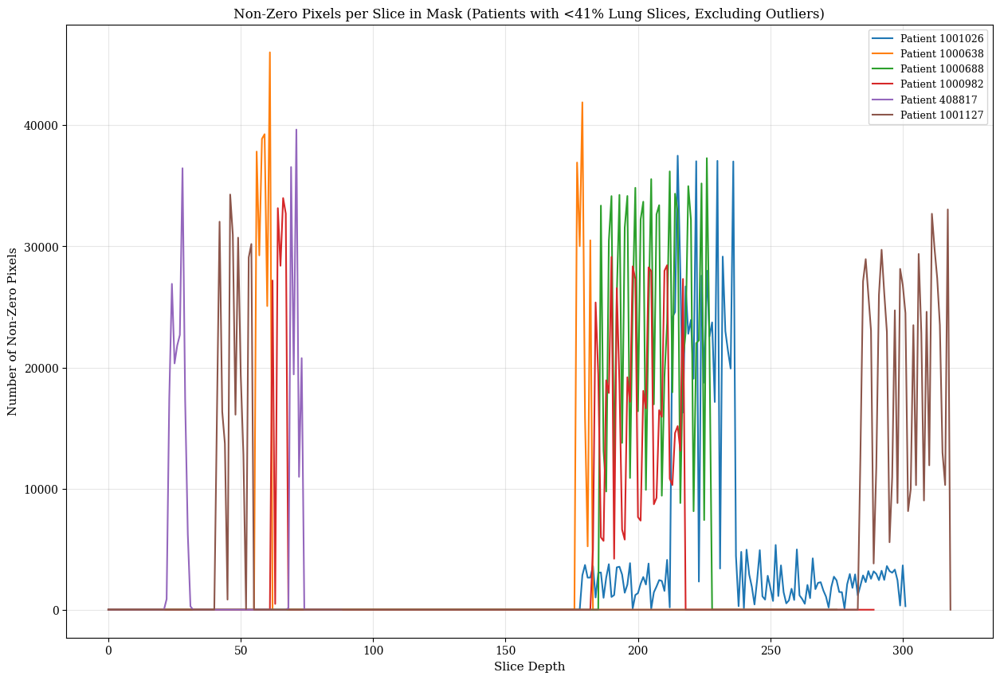

In [65]:
plot_nonzero_pixels_by_patients(patient_small_without_outliers, title_suffix=" (Patients with <41% Lung Slices, Excluding Outliers)")

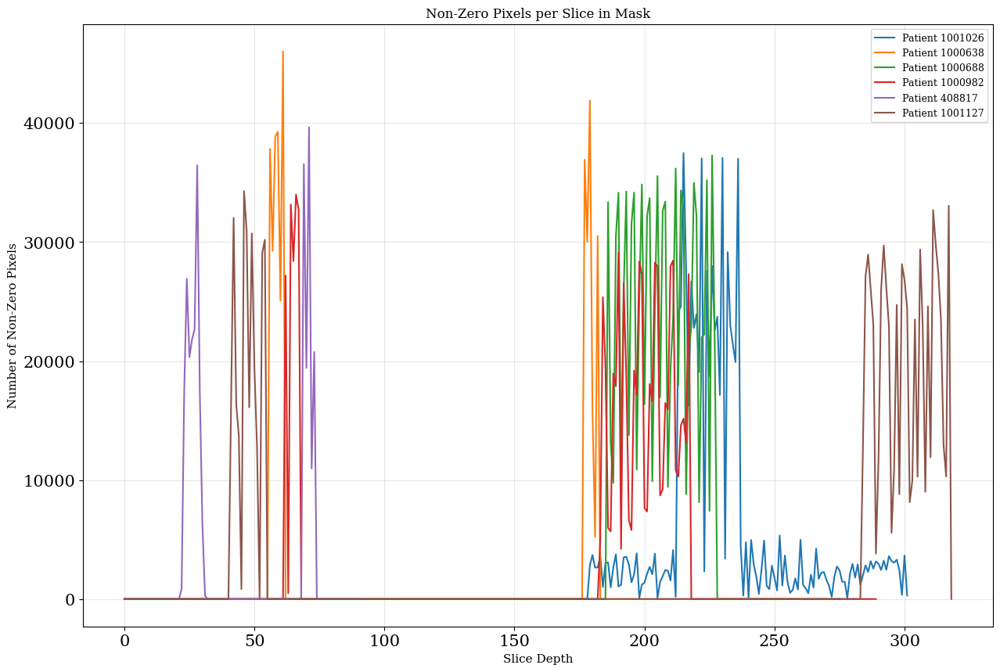

In [15]:

plt.figure(figsize=(15, 10))

for patient_id in patient_small_without_outliers:
    # Get mask path for this patient
    mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
    mask_scan = nib.load(mask_nifty_path).get_fdata()
    
    # Calculate non-zero pixels per slice
    non_zero_pixels_per_slice = [np.sum(mask_scan[i,:,:] > 0) for i in range(mask_scan.shape[0])]
    
    plt.plot(non_zero_pixels_per_slice, label=f'Patient {patient_id}')

plt.xlabel('Slice Depth')
plt.ylabel('Number of Non-Zero Pixels')
plt.title(f'Non-Zero Pixels per Slice in Mask')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()



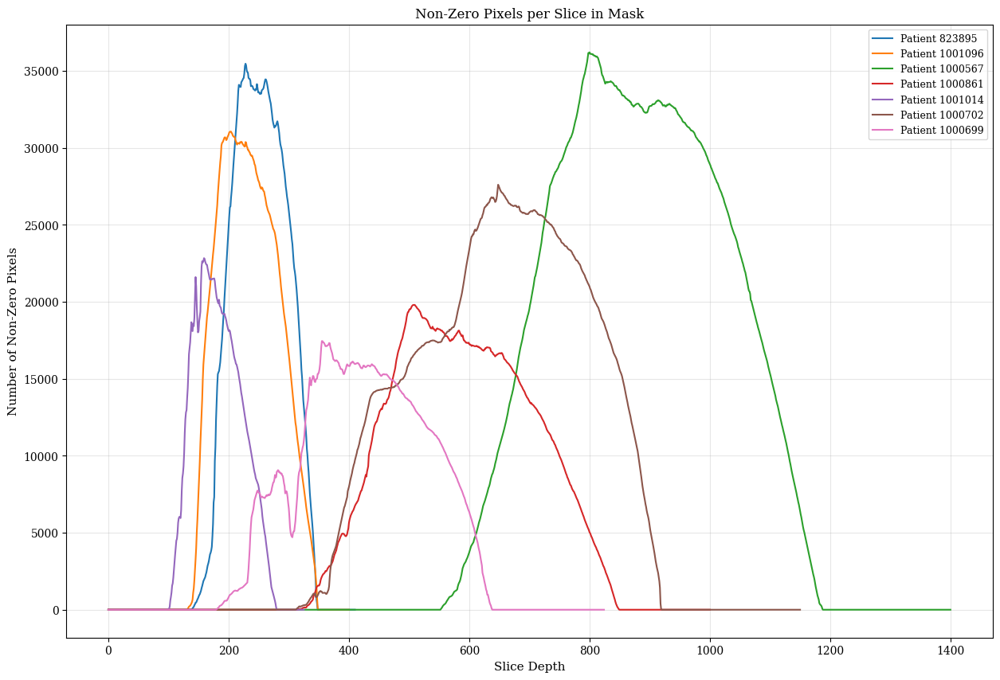

In [ ]:
plt.figure(figsize=(15, 10))

for patient_id in patient_small_without_outliers:
    # Get mask path for this patient
    mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
    mask_scan = nib.load(mask_nifty_path).get_fdata()
    
    # Calculate non-zero pixels per slice
    non_zero_pixels_per_slice = [np.sum(mask_scan[i,:,:] > 0) for i in range(mask_scan.shape[0])]
    
    plt.plot(non_zero_pixels_per_slice, label=f'Patient {patient_id}')

plt.xlabel('Slice Depth')
plt.ylabel('Number of Non-Zero Pixels')
plt.title(f'Non-Zero Pixels per Slice in Mask')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


plt.figure(figsize=(15, 10))

for patient_id in Patient_small_clean:
    # Get mask path for this patient
    mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
    mask_scan = nib.load(mask_nifty_path).get_fdata()
    
    # Calculate non-zero pixels per slice
    non_zero_pixels_per_slice = [np.sum(mask_scan[i,:,:] > 0) for i in range(mask_scan.shape[0])]
    
    plt.plot(non_zero_pixels_per_slice, label=f'Patient {patient_id}')

plt.xlabel('Slice Depth')
plt.ylabel('Number of Non-Zero Pixels')
plt.title(f'Non-Zero Pixels per Slice in Mask')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [18]:
plt.rcParams.update({
    "font.family": "serif",      # serif to match LaTeX article style
    "font.size": 10,
    "axes.titlesize": 18,
    "axes.labelsize": 18,
    "legend.fontsize": 9,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
})

/tmp/ipykernel_2214395/1876566533.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette_left = cm.get_cmap("RdYlBu", max(len(patient_small_without_outliers), 1))
/tmp/ipykernel_2214395/1876566533.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette_right = cm.get_cmap("BrBG", max(len(Patient_small_clean), 1))


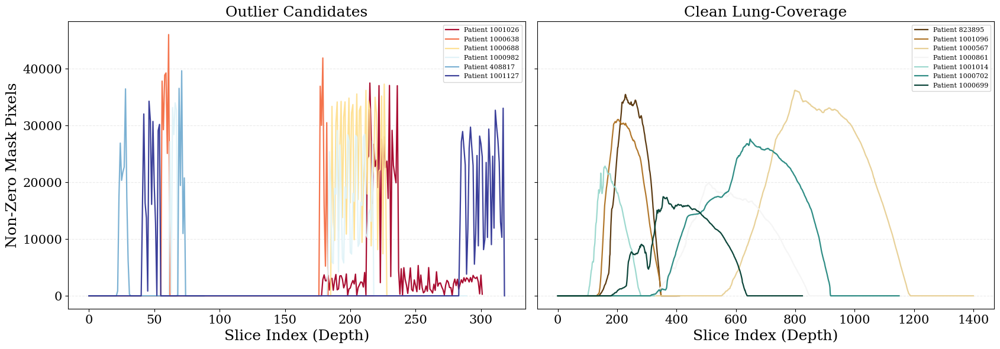

In [19]:
# Subplot version of the two line plots with an updated color palette
from matplotlib import cm
import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(17, 6), sharey=True)

# Choose palettes
palette_left = cm.get_cmap("RdYlBu", max(len(patient_small_without_outliers), 1))
palette_right = cm.get_cmap("BrBG", max(len(Patient_small_clean), 1))

# Left subplot: patient_small_without_outliers
for i, patient_id in enumerate(patient_small_without_outliers):
    mask_nifty_path = cases_df[cases_df["PatientID"] == patient_id]["Mask"].values[0]
    mask_scan = nib.load(mask_nifty_path).get_fdata()
    non_zero_pixels_per_slice = [np.sum(mask_scan[s, :, :] > 0) for s in range(mask_scan.shape[0])]

    axes[0].plot(
        non_zero_pixels_per_slice,
        color=palette_left(i),
        linewidth=1.6,
        alpha=0.95,
        label=f"Patient {patient_id}"
    )

axes[0].set_title("Outlier Candidates")
axes[0].set_xlabel("Slice Index (Depth)")
axes[0].set_ylabel("Non-Zero Mask Pixels")
axes[0].grid(axis='y', alpha=0.25, linestyle="--")
axes[0].legend(loc="upper right", fontsize=8, frameon=True)

# Right subplot: Patient_small_clean
for i, patient_id in enumerate(Patient_small_clean):
    mask_nifty_path = cases_df[cases_df["PatientID"] == patient_id]["Mask"].values[0]
    mask_scan = nib.load(mask_nifty_path).get_fdata()
    non_zero_pixels_per_slice = [np.sum(mask_scan[s, :, :] > 0) for s in range(mask_scan.shape[0])]

    axes[1].plot(
        non_zero_pixels_per_slice,
        color=palette_right(i),
        linewidth=1.6,
        alpha=0.95,
        label=f"Patient {patient_id}"
    )

axes[1].set_title("Clean Lung-Coverage")
axes[1].set_xlabel("Slice Index (Depth)")
axes[1].grid(axis='y', alpha=0.25, linestyle="--")
axes[1].legend(loc="upper right", fontsize=8, frameon=True)

#plt.suptitle("Non-Zero Mask Pixels Across Depth: Two Patient Groups", y=1.02)
plt.tight_layout()
plt.savefig("non_zero_mask_pixels_by_depth_comparison.png", dpi=300)
plt.show()

### New outliers
After plotting the nonzero pixel per slice distribution of the scan with percentlung < 2*mean - 2*std = 44%, we indentified 6 new outliers. Two of the scans in the interval [42, 44] are valid scans that are really deep making the lung region very small in terms of depth. That why the **threashold was adjusted to 41%** to avoid removing valid scans. 

In [18]:
def plot_scan_slices(patient_id, num_slices=6, rotate=False):
    scan_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Image'].values[0]
    mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
    mask = nib.load(mask_nifty_path).get_fdata()
    scan = nib.load(scan_nifty_path).get_fdata()
    if rotate:
        volume_axial_mask = np.transpose(mask, (1, 2, 0))
        volume_axial_scan = np.transpose(scan, (1, 2, 0))
        scan = np.flip(volume_axial_scan, axis=0)
        mask = np.flip(volume_axial_mask, axis=0)
        
    print(f"Scan shape: {scan.shape}")
    
    # Create subplot grid based on num_slices
    if num_slices <= 3:
        rows, cols = 1, num_slices
    elif num_slices <= 6:
        rows, cols = 2, 3
    elif num_slices <= 9:
        rows, cols = 3, 3
    else:
        rows, cols = 4, 4  # Maximum 16 slices
        num_slices = min(num_slices, 16)  # Limit to 16 slices max
    
    fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
    
    # Handle single subplot case
    if num_slices == 1:
        axes = [axes]
    elif rows == 1 or cols == 1:
        axes = axes.flatten()
    else:
        axes = axes.ravel()
    
    # Select slice indices evenly spaced across the depth
    slice_indices = np.linspace(0, scan.shape[0]-1, num_slices, dtype=int)
    
    for i, slice_idx in enumerate(slice_indices):
        axes[i].imshow(scan[slice_idx, :, :], cmap='gray')
        axes[i].set_title(f'Slice {slice_idx}')
        axes[i].axis('off')
    
    plt.suptitle(f'Scan Slices (Total: {scan.shape[0]})')
    plt.tight_layout()
    plt.show()


def plot_scan_with_mask(patient_id, slice_idx, rotate=False):
    scan_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Image'].values[0]
    mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
    mask = nib.load(mask_nifty_path).get_fdata()
    scan = nib.load(scan_nifty_path).get_fdata()

    if rotate:
        volume_axial_mask = np.transpose(mask, (1, 2, 0))
        volume_axial_scan = np.transpose(scan, (1, 2, 0))
        scan = np.flip(volume_axial_scan, axis=0)
        mask = np.flip(volume_axial_mask, axis=0)
        

    print(f"Scan shape: {scan.shape}")
    
    try:
        scan_slice = scan[slice_idx, :, :]
        mask_slice = mask[slice_idx, :, :]

        masked_scan_slice = scan_slice * mask_slice
    except Exception as e:
        print(f"Error: Slice index {slice_idx} is out of bounds for scan with depth {scan.shape[0]}")
        #rotate the mask
        rotated_mask = np.transpose(mask, (1, 2, 0))
        scan_slice = scan[slice_idx, :, :]
        mask_slice = rotated_mask[slice_idx, :, :]

        masked_scan_slice = scan_slice * mask_slice
        
        

    
    fig, axes = plt.subplots(1, 3, figsize=(15, 8))        
    
    axes[0].imshow(scan_slice, cmap='gray')
    axes[0].set_title(f'Scan Slice {slice_idx}')
    axes[0].axis('off')
    
    axes[1].imshow(mask_slice, cmap='gray')
    axes[1].set_title(f'Mask Slice {slice_idx}')
    axes[1].axis('off')
    
    axes[2].imshow(masked_scan_slice, cmap='gray')
    axes[2].set_title(f'Masked Scan Slice {slice_idx}')
    axes[2].axis('off')
    
    plt.suptitle(f'Patient {patient_id} - Slice {slice_idx}')
    plt.tight_layout()
    plt.show()

### Plot scans for outlier patients to see if they can be corrected
Result: none of the outliers can be corrected/rotated to resegment the lung region better.

Scan shape: (512, 512, 302)


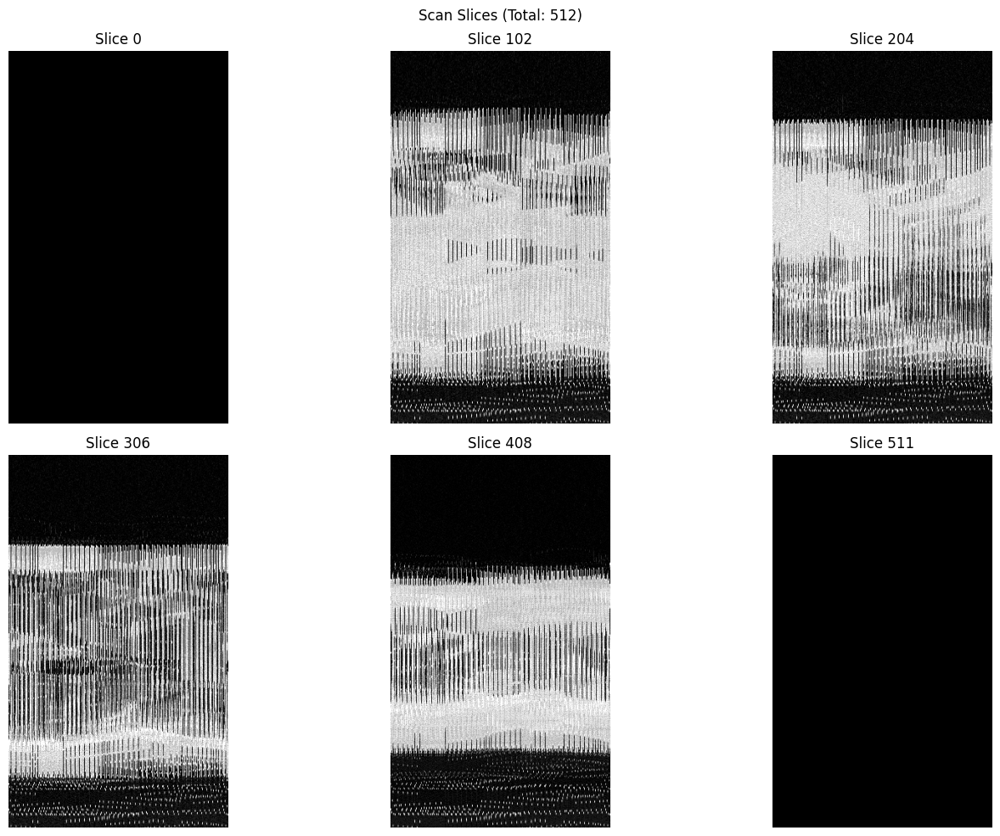

Scan shape: (302, 512, 512)


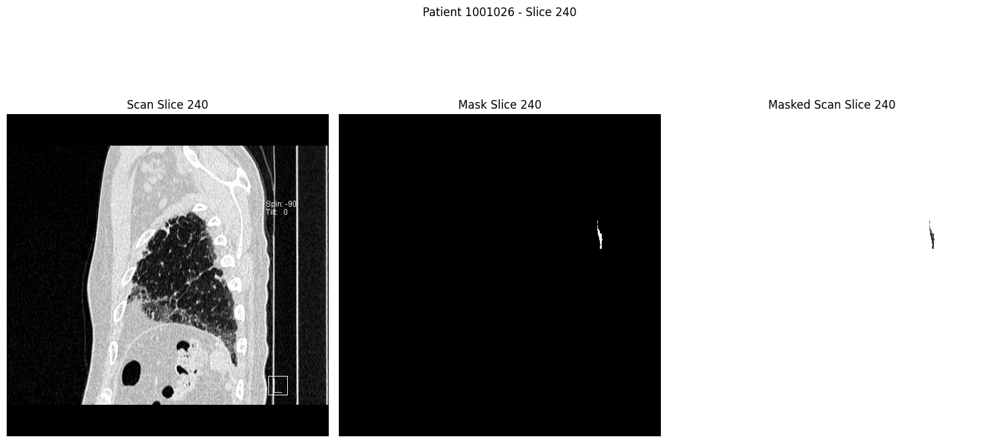

Scan shape: (512, 512, 302)


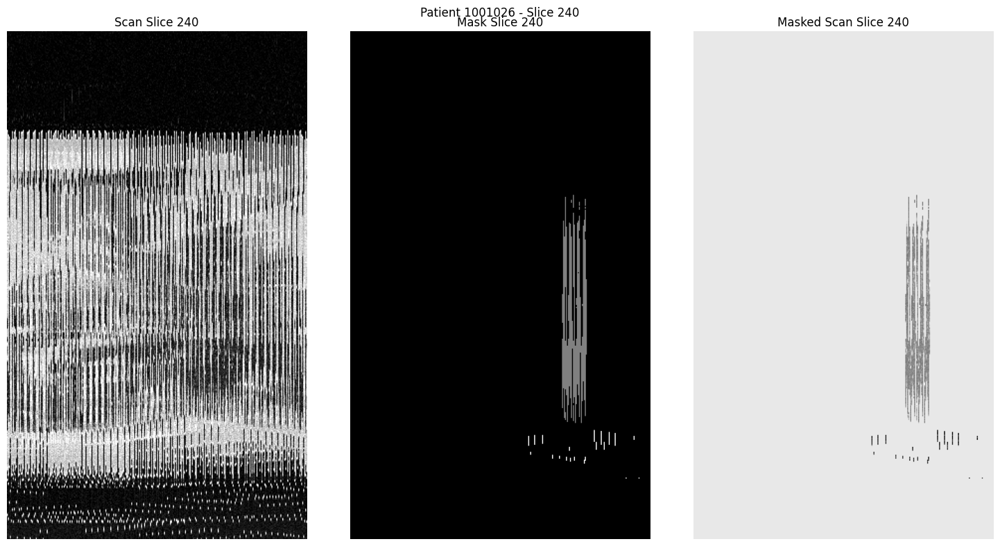

Scan shape: (512, 512, 258)


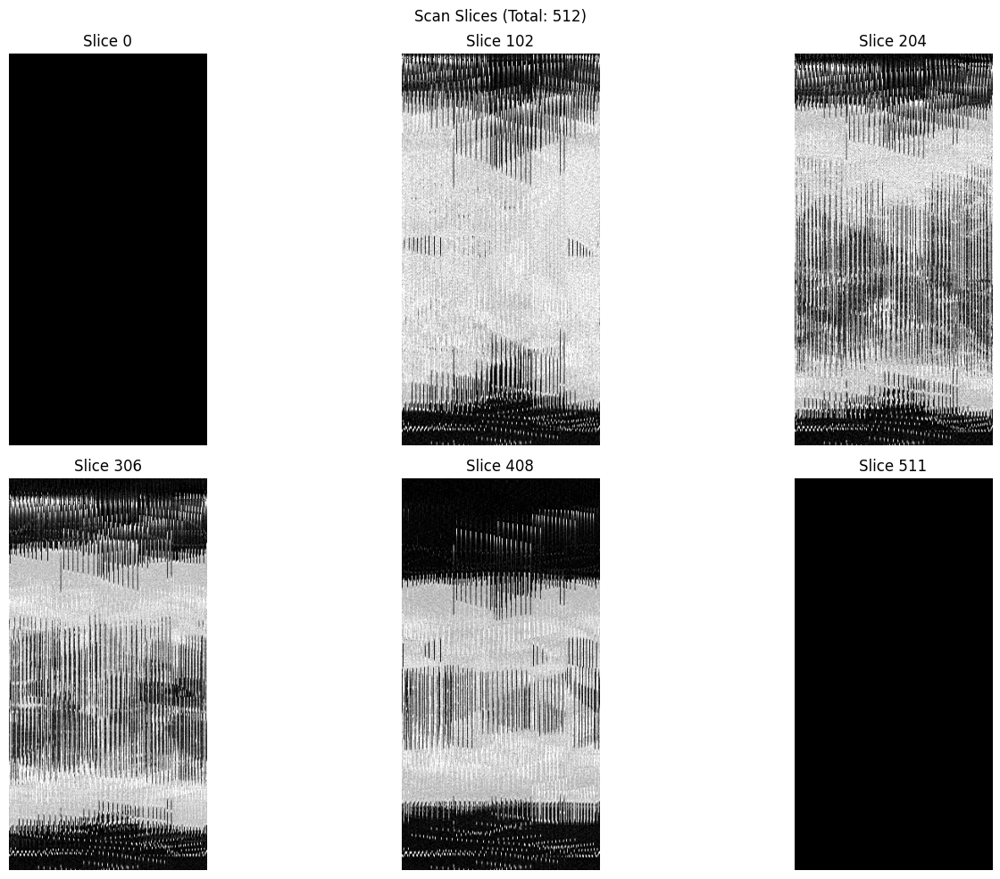

Scan shape: (258, 512, 512)


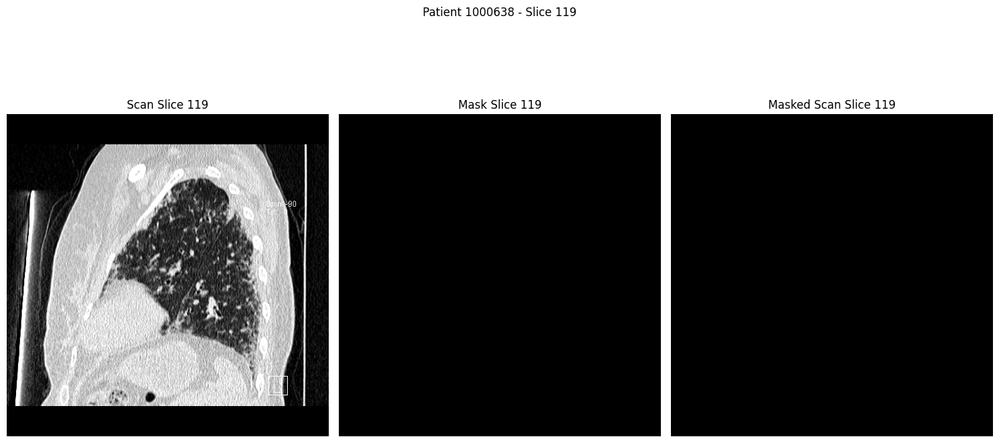

Scan shape: (512, 512, 258)


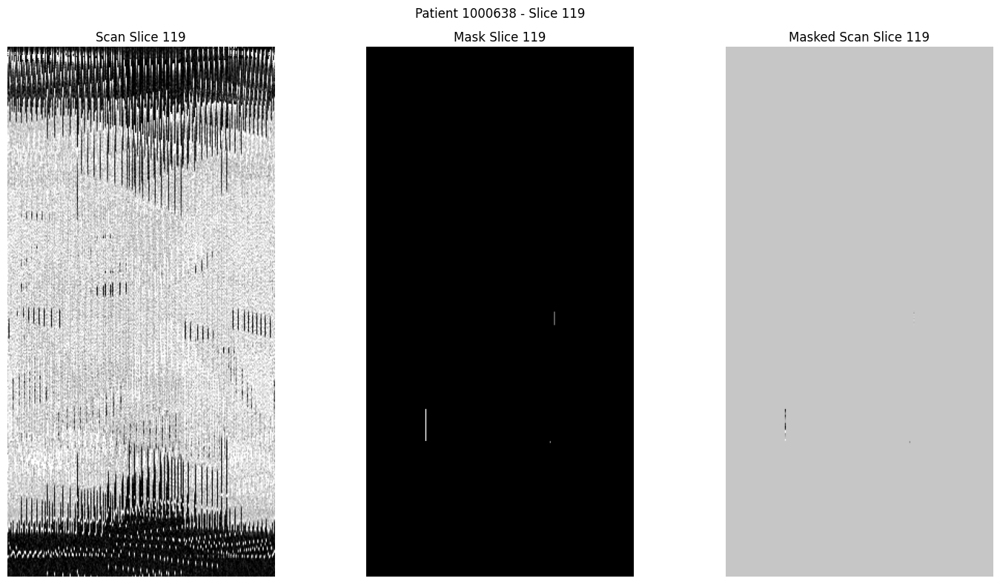

Scan shape: (512, 512, 276)


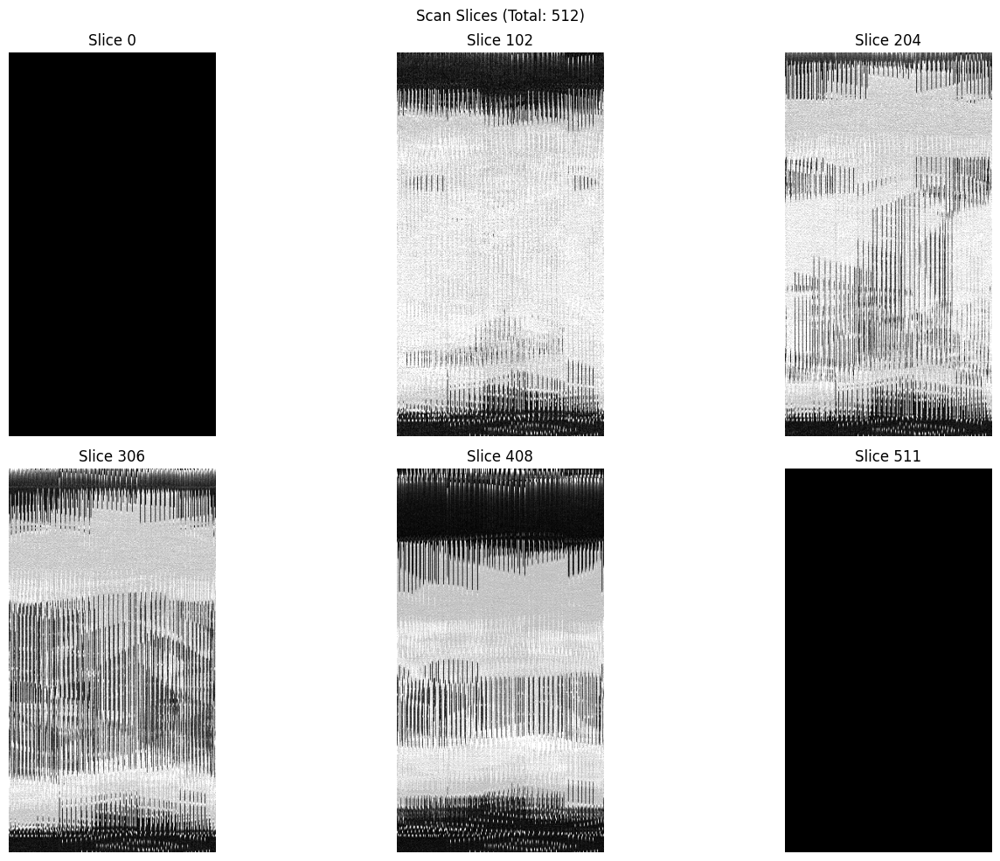

Scan shape: (276, 512, 512)


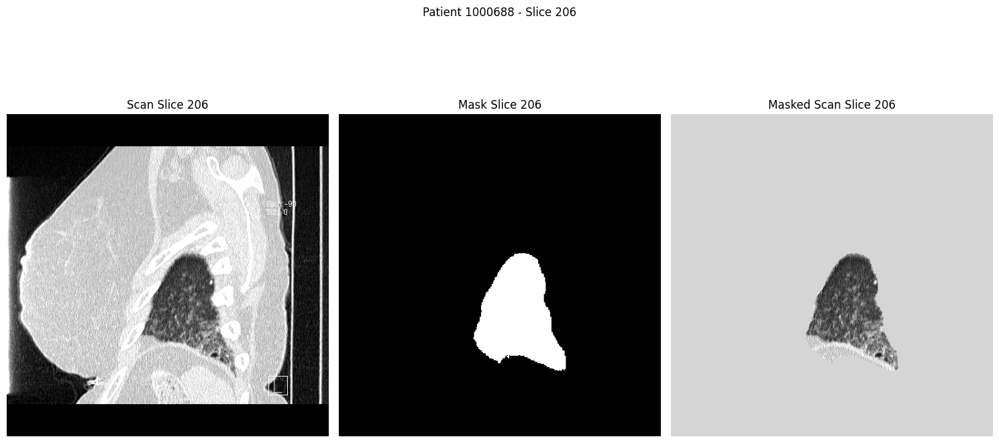

Scan shape: (512, 512, 276)


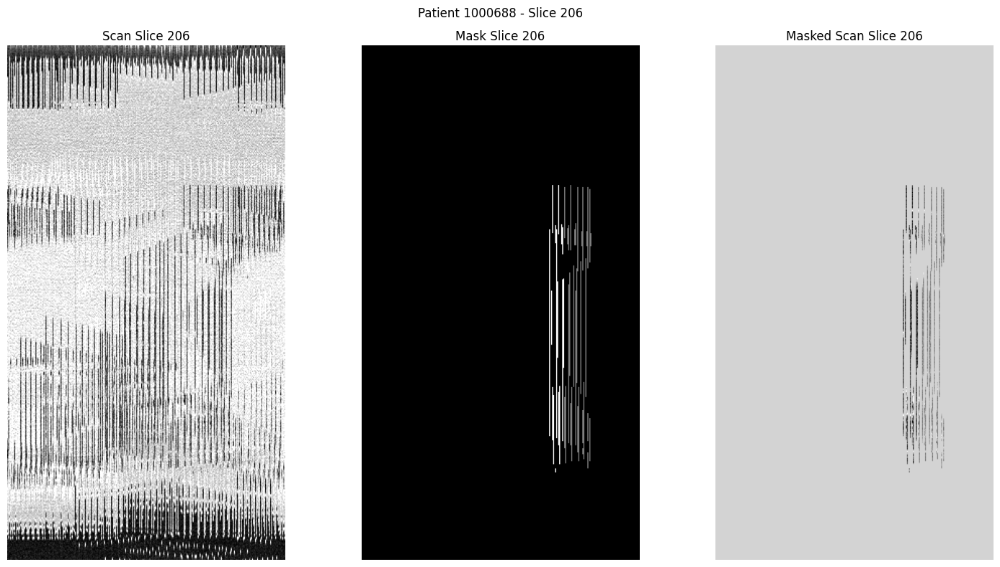

Scan shape: (512, 512, 290)


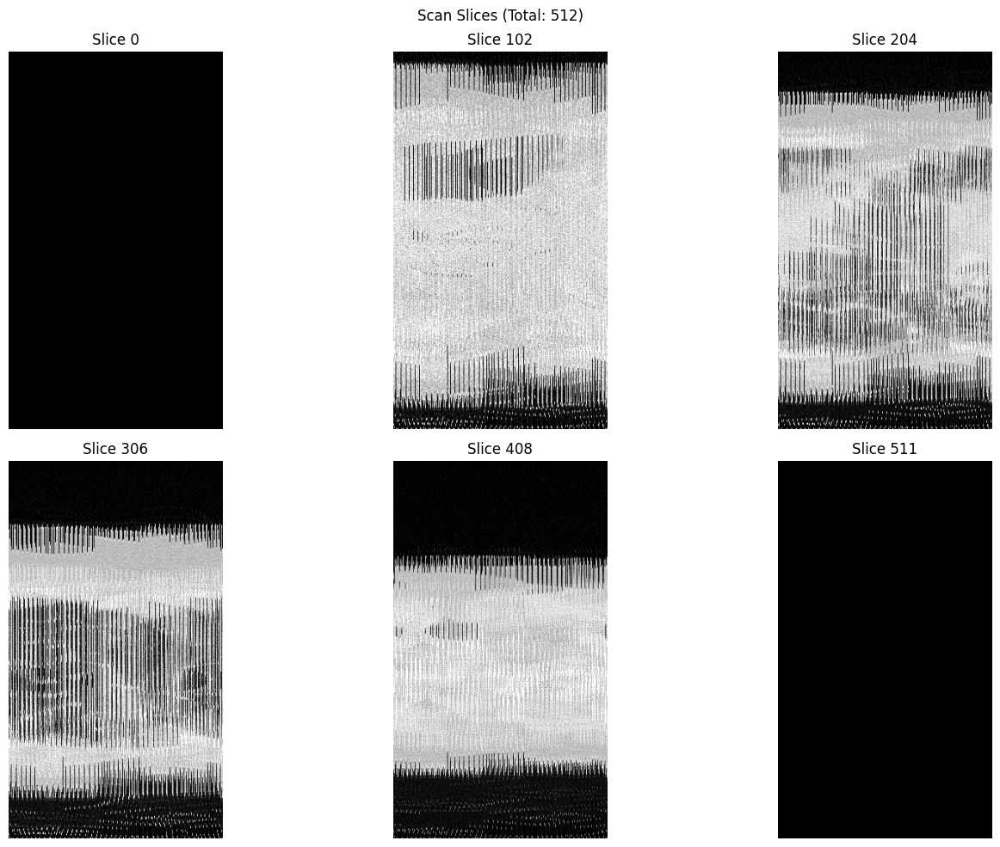

Scan shape: (290, 512, 512)


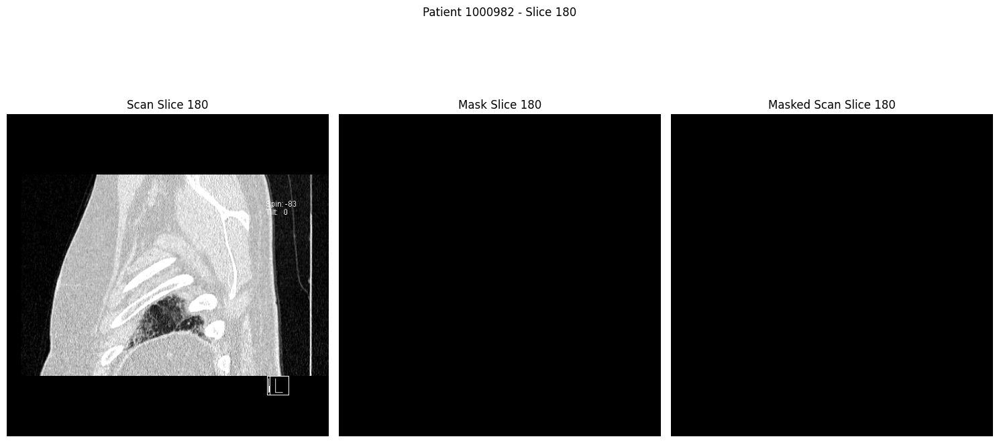

Scan shape: (512, 512, 290)


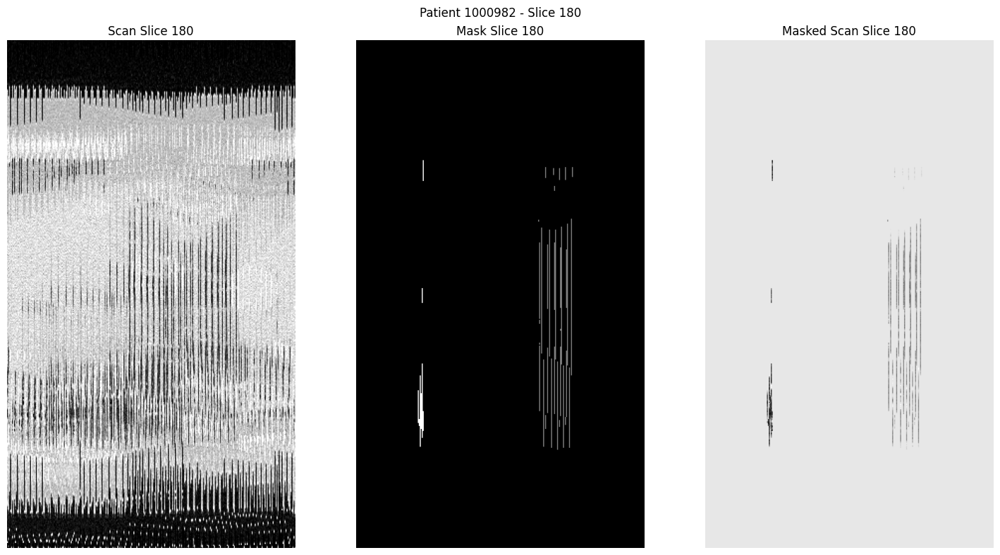

Scan shape: (512, 512, 89)


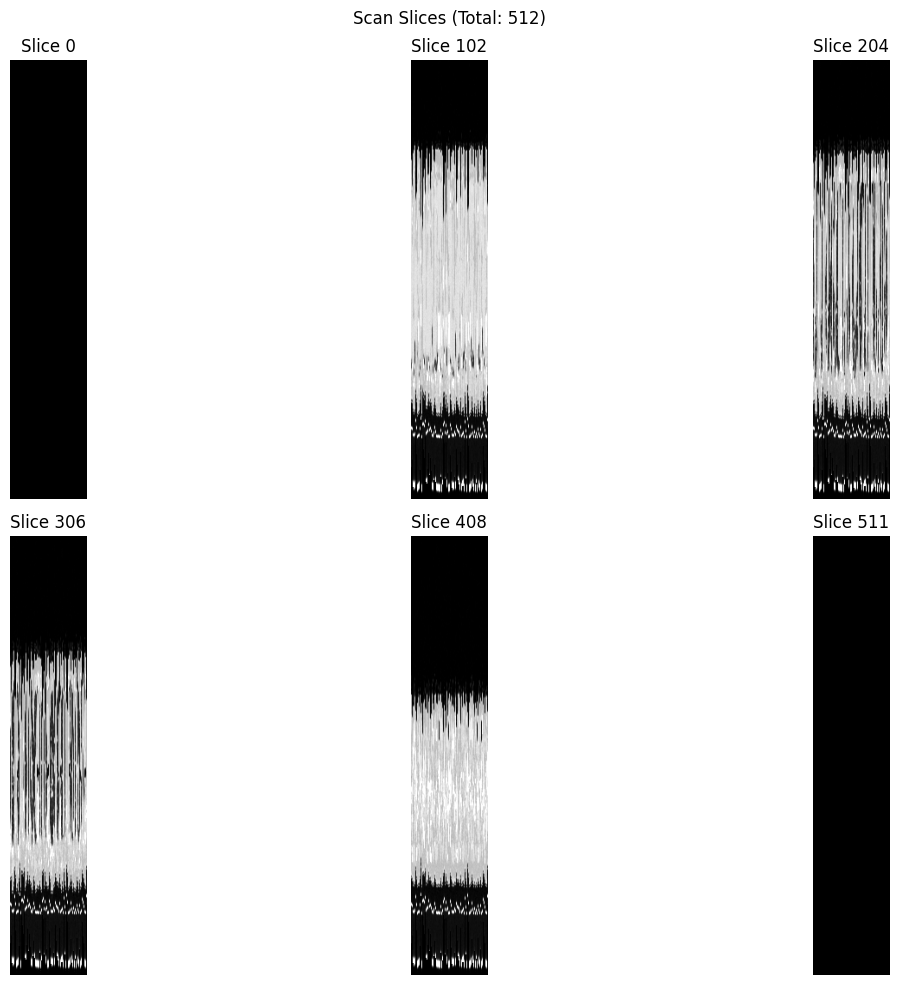

Scan shape: (89, 512, 512)


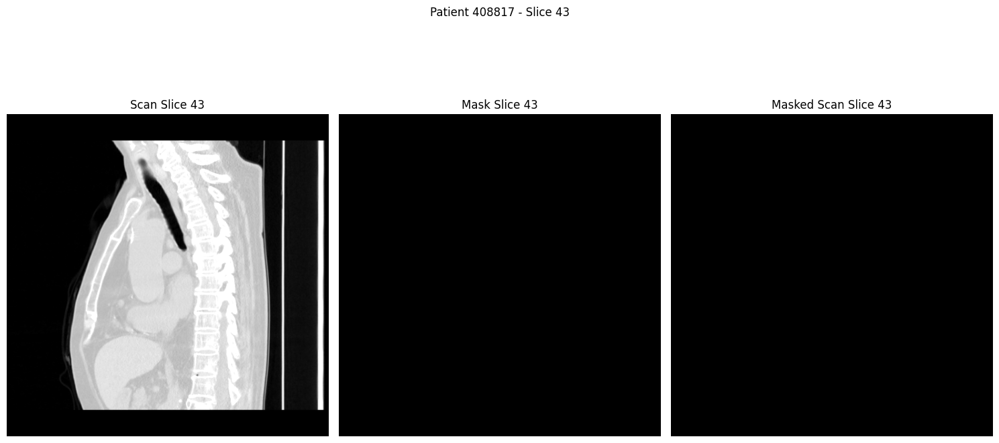

Scan shape: (512, 512, 89)


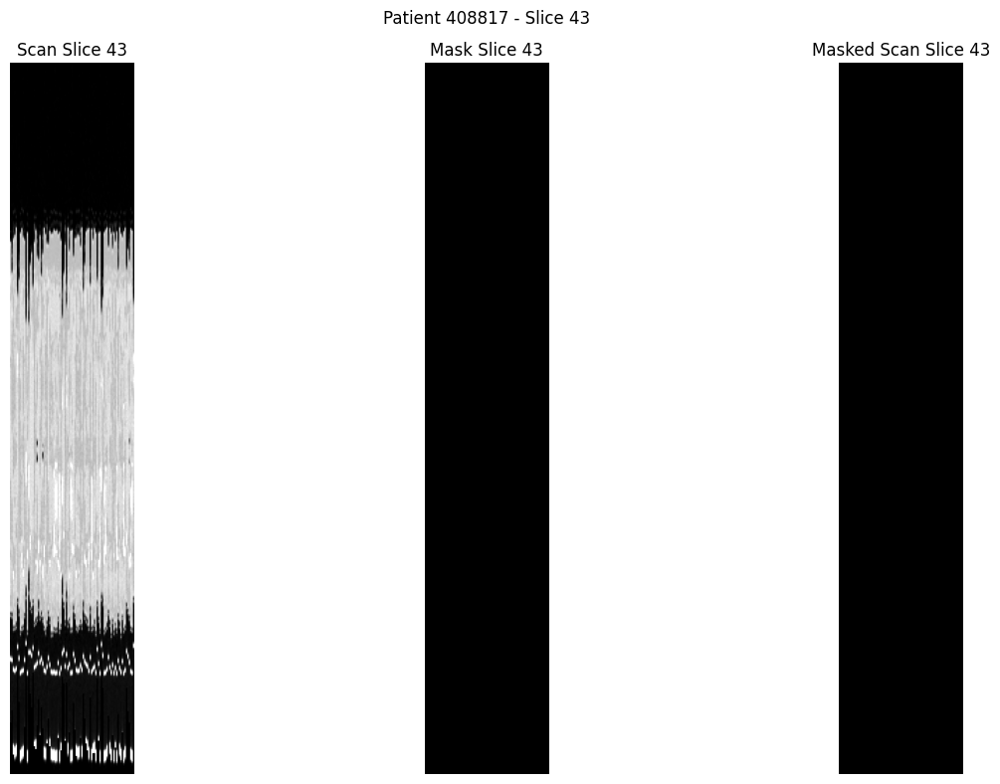

Scan shape: (512, 512, 319)


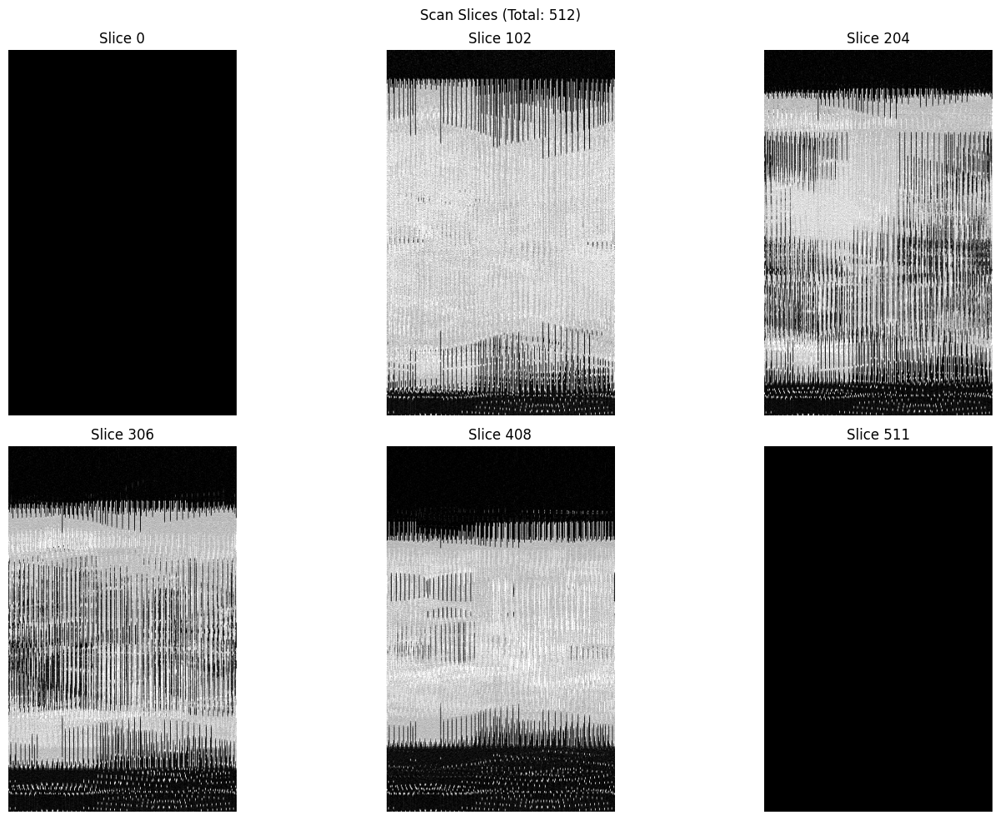

Scan shape: (319, 512, 512)


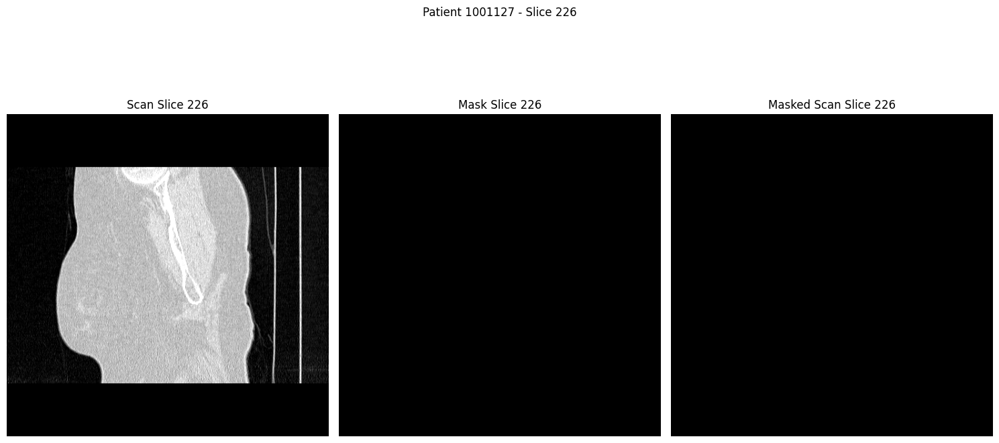

Scan shape: (512, 512, 319)


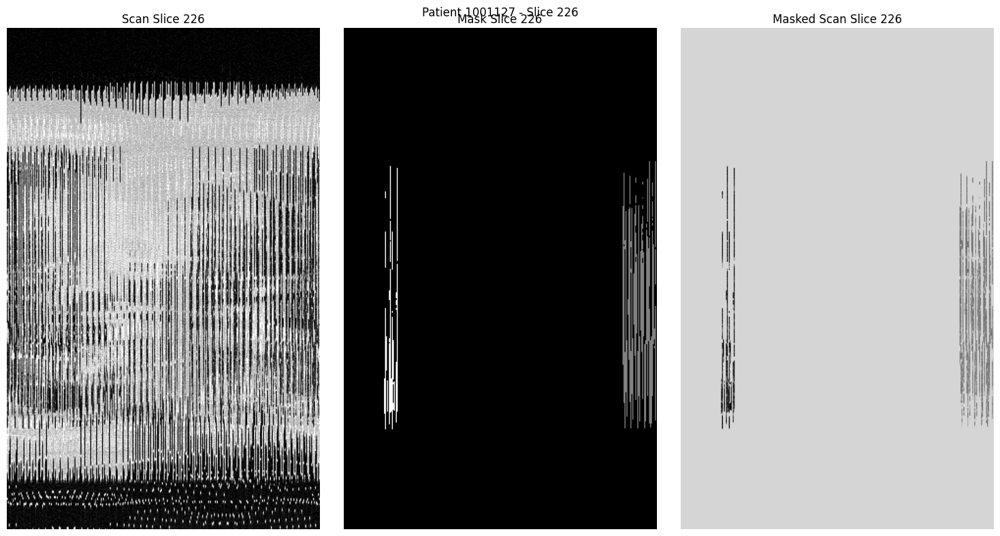

In [ ]:
for patient in patient_small_without_outliers:
    plot_scan_slices(patient, num_slices=6, rotate=True)
    mean_slice = int(cases_df[cases_df['PatientID'] == patient]['MeanNonzeroSlicePosition'].values[0])
    plot_scan_with_mask(patient, slice_idx=mean_slice, rotate=False)
    plot_scan_with_mask(patient, slice_idx=mean_slice, rotate=True)

Scan shape: (512, 512, 401)


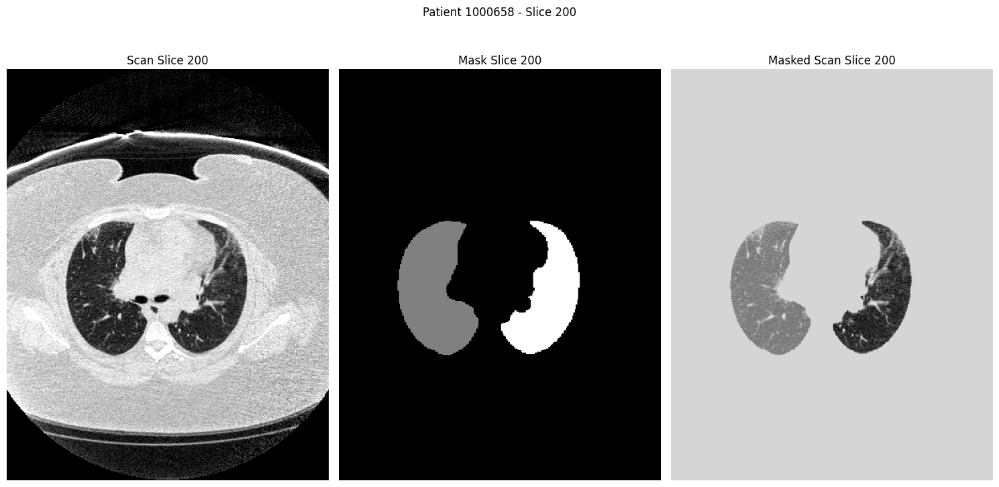

In [20]:
plot_scan_with_mask(1000658, 200)

Scan shape: (512, 401, 512)


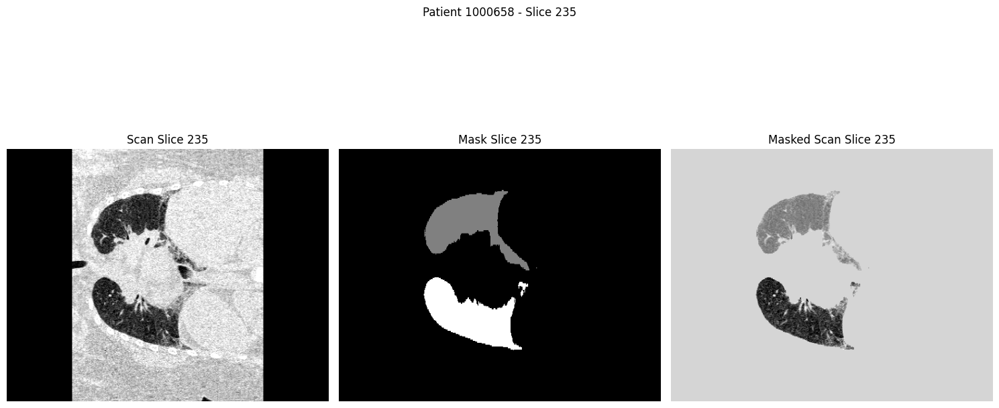

Scan shape: (512, 395, 512)


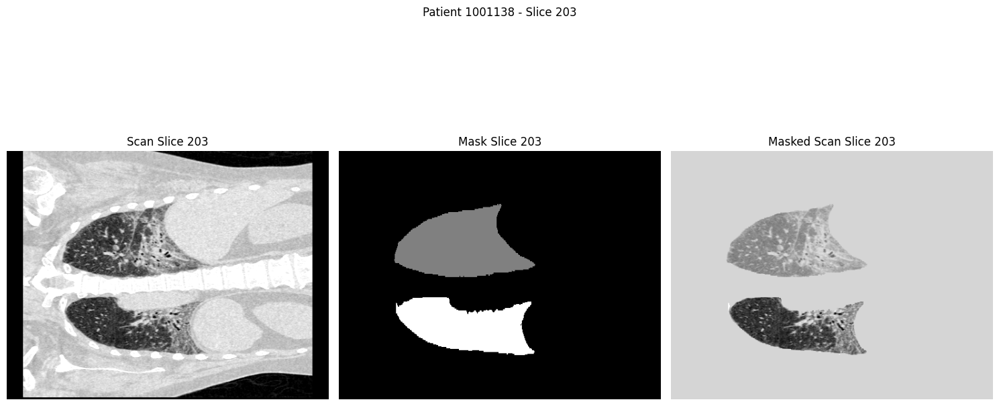

Scan shape: (261, 512, 512)
Error: Slice index 144 is out of bounds for scan with depth 261
Error processing patient 1001244: operands could not be broadcast together with shapes (512,512) (261,512) 


In [21]:
for patient in [1000658,1001138,1001244]:
    try:
        #plot_scan_slices(patient, num_slices=6, rotate=True)
        mean_positions = cases_df[cases_df['PatientID'] == patient]['MeanNonzeroSlicePosition'].values[0]
        middle_slice = int(mean_positions)
        plot_scan_with_mask(patient, slice_idx=middle_slice, rotate=True)
    except Exception as e:
        print(f"Error processing patient {patient}: {e}")

In [22]:
df_without_outliers = cases_df[cases_df['PercentLungSlices'] >= 41]

In [23]:
df_without_outliers[~df_without_outliers['PatientID'].isin(list_outlier_corected)].to_csv('cleaned_collected_cases.csv', index=False)

## Prepocissing for model training
After exploring the depth of the mask, we can preprocess the data for model training. This includes:
1. **Resizing**: Resize the images and masks to a consistent size for model input.
2. **Normalization**: Normalize the pixel values to a standard range 

**Customed Resizing:** centred around the lung region, cropping non-lung areas, for scan with depth > 400 remove some slices inbetween to reduce depth to 400. For scan with depth < 400, we can pad the slices with zeros to reach a depth of 400.

For sclices with dimensions not equal to 512x512, zero padding can be applied to reach the desired dimensions. For those larger than 512x512, we can resize them down to 512x512 using interpolation methods.



In [2]:
import pandas as pd

In [42]:
cases_df = pd.read_csv('cleaned_collected_cases.csv')
patient_with_followup_yash = pd.read_csv('../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUCTURE_MAIN/Patients_with_followup_48_56.csv')
patient_with_followup_yash

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,Followup FVC Week,Followup Acquisition Date,Followup SeriesInstanceUID,Primary Diagnosis,Sex,Delta FVC
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,53.0,1977-10-03,1.3.46.670589.33.1.63668740139523062900002.571...,CTD-ILD,Female,0.24
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,55.0,1970-10-26,1.2.840.113704.1.111.12856.1392370004.12,UILD,Female,-0.10
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,53.0,1950-11-06,1.2.840.113704.1.111.12868.1380700384.12,UILD,Female,-0.12
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,48.0,NaN,NaN,IPF,Male,-0.05
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,53.0,1977-10-03,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,CTD-ILD,Female,-0.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,52.0,NaN,NaN,CTD-ILD,Female,-0.04
571,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,52.0,NaN,NaN,Idiopathic OP,Male,-0.61
572,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,52.0,NaN,NaN,IPF,Male,0.13
573,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,52.0,NaN,NaN,IPF,Male,-0.02


In [43]:
patient_cases = cases_df['PatientID'].tolist()
followup_filtered = patient_with_followup_yash[patient_with_followup_yash['Subject ID'].isin(patient_cases)]
#change name of column 'Subject ID' to 'PatientID'
followup_filtered = followup_filtered.rename(columns={'Subject ID': 'PatientID'})

In [44]:
# add missing column from followup_filtered to cases_df
column_to_add = list(set(followup_filtered.columns) - set(cases_df.columns)) 
# merge both dataframes on 'PatientID'
merged_df = pd.merge(cases_df, followup_filtered[['PatientID'] + column_to_add], on='PatientID', how='left')
merged_df.to_csv('cleaned_collected_cases_with_followup.csv', index=False)
merged_df

,PatientID,BaselineDate,SeriesUID,Image,Mask,Followup FVC Predicted %,Baseline FVC Predicted %,Baseline SeriesInstanceUID,Depth,NonzeroDepth,...,Baseline FVC Volume L,Followup FVC Volume L,Followup SeriesInstanceUID,Baseline Acquisition Date,Baseline FVC Week,Delta FVC,Followup FVC DATE,Primary Diagnosis,Followup FVC Week,Followup Acquisition Date
0,1001326,1971-01-01,1.2.826.0.1.3680043.10.1218.729327262603124254...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,94.70,95.7,1.2.826.0.1.3680043.10.1218.729327262603124254...,983.0,591.0,...,2.59,2.56,NaN,1971-01-01,0,-0.03,1972-01-21,CTD-ILD,55.0,NaN
1,298078,1967-10-09,1.2.392.200036.9116.2.6.1.3268.2047398422.1539...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,118.10,96.7,1.2.392.200036.9116.2.6.1.3268.2047398422.1539...,396.0,254.0,...,2.34,2.81,NaN,1967-10-09,0,0.47,1968-10-28,UILD,55.0,NaN
2,727988,1970-10-05,1.2.392.200036.9116.2.6.1.3268.2047398422.1581...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,68.40,75.8,1.2.392.200036.9116.2.6.1.3268.2047398422.1581...,376.0,235.0,...,2.48,2.23,NaN,1970-10-05,0,-0.25,1971-09-27,UILD,49.0,NaN
3,1001092,1980-01-01,1.2.826.0.1.3680043.10.1218.114401689482668046...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,88.03,88.3,1.2.826.0.1.3680043.10.1218.114401689482668046...,290.0,204.0,...,3.73,3.70,NaN,1980-01-01,0,-0.03,1981-01-21,UILD,55.0,NaN
4,772512,1973-10-01,1.2.392.200036.9116.2.6.1.3268.2047398422.1563...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,77.20,73.9,1.2.392.200036.9116.2.6.1.3268.2047398422.1563...,396.0,256.0,...,2.35,2.44,1.2.840.113619.2.55.3.1024080006.924.159416135...,1973-10-01,0,0.09,1974-09-23,UILD,51.0,1974-09-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
551,884616,1973-10-01,1.2.840.113704.1.111.5736.1296042285.14,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,84.00,88.0,1.2.840.113704.1.111.5736.1296042285.14,586.0,388.0,...,2.63,2.40,NaN,1973-10-01,0,-0.23,1974-09-23,UILD,51.0,NaN
552,1000939,1966-01-01,1.2.826.0.1.3680043.10.1218.108959920576339993...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,93.40,96.8,1.2.826.0.1.3680043.10.1218.108959920576339993...,893.0,648.0,...,2.97,2.80,NaN,1966-01-01,0,-0.17,1966-12-03,UILD,48.0,NaN
553,583963,1968-10-07,1.3.46.670589.33.1.63665194667176200700002.480...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,59.00,66.0,1.3.46.670589.33.1.63665194667176200700002.480...,458.0,386.0,...,2.71,2.49,NaN,1968-10-07,0,-0.22,1969-11-03,IPF,56.0,NaN
554,1000731,1975-01-01,1.2.826.0.1.3680043.10.1218.505692788176939779...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,84.60,84.0,1.2.826.0.1.3680043.10.1218.505692788176939779...,1001.0,600.0,...,1.97,1.94,NaN,1975-01-01,0,-0.03,1975-12-17,IPF,50.0,NaN


In [45]:
# regression dataframe
regression_df = pd.read_csv('./df_regression_analysis.csv', index_col=False)
filtered_regression_df= regression_df[regression_df['Subject ID'].isin(merged_df['PatientID'].tolist())]
filtered_regression_df.info()
# change name of column 'Subject ID' to 'PatientID'
filtered_regression_df = filtered_regression_df.rename(columns={'Subject ID': 'PatientID'})
# add age column from filtered_regression_df to merged_df
final_df = pd.merge(merged_df, filtered_regression_df[['PatientID', 'Age', 'Smoking History']], on='PatientID', how='left')
final_df.to_csv('cleaned_collected_cases_with_followup_and_age.csv', index=False)
final_df

<class 'pandas.core.frame.DataFrame'>
Index: 556 entries, 0 to 574
Data columns (total 38 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Subject ID                                   556 non-null    int64  
 1   Age                                          405 non-null    object 
 2   FVC Predicted %_Baseline                     554 non-null    float64
 3   FVC DATE                                     556 non-null    object 
 4   FVC Volume L                                 556 non-null    float64
 5   Ethnicity                                    277 non-null    object 
 6   Race                                         258 non-null    object 
 7   Home Region                                  556 non-null    object 
 8   Sex                                          556 non-null    object 
 9   Research : Height                            555 non-null    float64
 10  Immunom

,PatientID,BaselineDate,SeriesUID,Image,Mask,Followup FVC Predicted %,Baseline FVC Predicted %,Baseline SeriesInstanceUID,Depth,NonzeroDepth,...,Followup SeriesInstanceUID,Baseline Acquisition Date,Baseline FVC Week,Delta FVC,Followup FVC DATE,Primary Diagnosis,Followup FVC Week,Followup Acquisition Date,Age,Smoking History
0,1001326,1971-01-01,1.2.826.0.1.3680043.10.1218.729327262603124254...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,94.70,95.7,1.2.826.0.1.3680043.10.1218.729327262603124254...,983.0,591.0,...,NaN,1971-01-01,0,-0.03,1972-01-21,CTD-ILD,55.0,NaN,71.0,Ex Smoker
1,298078,1967-10-09,1.2.392.200036.9116.2.6.1.3268.2047398422.1539...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,118.10,96.7,1.2.392.200036.9116.2.6.1.3268.2047398422.1539...,396.0,254.0,...,NaN,1967-10-09,0,0.47,1968-10-28,UILD,55.0,NaN,NaN,Never Smoker
2,727988,1970-10-05,1.2.392.200036.9116.2.6.1.3268.2047398422.1581...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,68.40,75.8,1.2.392.200036.9116.2.6.1.3268.2047398422.1581...,376.0,235.0,...,NaN,1970-10-05,0,-0.25,1971-09-27,UILD,49.0,NaN,NaN,Ex Smoker
3,1001092,1980-01-01,1.2.826.0.1.3680043.10.1218.114401689482668046...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,88.03,88.3,1.2.826.0.1.3680043.10.1218.114401689482668046...,290.0,204.0,...,NaN,1980-01-01,0,-0.03,1981-01-21,UILD,55.0,NaN,80.0,Never Smoker
4,772512,1973-10-01,1.2.392.200036.9116.2.6.1.3268.2047398422.1563...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,77.20,73.9,1.2.392.200036.9116.2.6.1.3268.2047398422.1563...,396.0,256.0,...,1.2.840.113619.2.55.3.1024080006.924.159416135...,1973-10-01,0,0.09,1974-09-23,UILD,51.0,1974-09-23,74.0,Ex Smoker
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
551,884616,1973-10-01,1.2.840.113704.1.111.5736.1296042285.14,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,84.00,88.0,1.2.840.113704.1.111.5736.1296042285.14,586.0,388.0,...,NaN,1973-10-01,0,-0.23,1974-09-23,UILD,51.0,NaN,NaN,Ex Smoker
552,1000939,1966-01-01,1.2.826.0.1.3680043.10.1218.108959920576339993...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,93.40,96.8,1.2.826.0.1.3680043.10.1218.108959920576339993...,893.0,648.0,...,NaN,1966-01-01,0,-0.17,1966-12-03,UILD,48.0,NaN,66.0,Never Smoker
553,583963,1968-10-07,1.3.46.670589.33.1.63665194667176200700002.480...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,59.00,66.0,1.3.46.670589.33.1.63665194667176200700002.480...,458.0,386.0,...,NaN,1968-10-07,0,-0.22,1969-11-03,IPF,56.0,NaN,NaN,Ex Smoker
554,1000731,1975-01-01,1.2.826.0.1.3680043.10.1218.505692788176939779...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...,84.60,84.0,1.2.826.0.1.3680043.10.1218.505692788176939779...,1001.0,600.0,...,NaN,1975-01-01,0,-0.03,1975-12-17,IPF,50.0,NaN,75.0,Ex Smoker


In [ ]:
# Statititic on merged_df
merged_df = pd.read_csv('cleaned_collected_cases_with_followup_and_age.csv')
#print(merged_df.head())

#transform age to numeric
merged_df['Age'] = pd.to_numeric(merged_df['Age'], errors='coerce')
# replace NaN values in 'Age' with the mean age
merged_df['Age'].fillna(merged_df['Age'].mean(), inplace=True)

# if Smoking History is NaN, replace with 'Unknown'
merged_df['Smoking History'].fillna('Unknown', inplace=True)
 
print("Number of patients with follow-up FCV and baseline scan:", merged_df['PatientID'].nunique())
# table with statistics on 'Sex' 'Age' 'Smoking History' 'Baseline FVC Volume L' 'Followup FVC Volume L'
stats_columns = ['Sex', 'Baseline FVC Volume L', 'Followup FVC Volume L', 'Primary Diagnosis', 'Age']
merged_df.columns
for col in stats_columns:
    print(f"Statistics for {col}:")
    print(merged_df[col].describe())
    print("\n")
#merged_df['Primary Diagnosis'].value_counts()

# if diagnosis count smaller than 10, replace with 'Other'
merged_df['Primary Diagnosis'] = merged_df['Primary Diagnosis'].apply(lambda x: x if merged_df['Primary Diagnosis'].value_counts()[x] >= 10 else 'Other')
#merged_df['Primary Diagnosis'].value_counts()

# save final dataframe
# merged_df.to_csv('cleaned_collected_cases_final.csv', index=False)

   PatientID BaselineDate                                          SeriesUID  \
0    1001326   1971-01-01  1.2.826.0.1.3680043.10.1218.729327262603124254...   
1     298078   1967-10-09  1.2.392.200036.9116.2.6.1.3268.2047398422.1539...   
2     727988   1970-10-05  1.2.392.200036.9116.2.6.1.3268.2047398422.1581...   
3    1001092   1980-01-01  1.2.826.0.1.3680043.10.1218.114401689482668046...   
4     772512   1973-10-01  1.2.392.200036.9116.2.6.1.3268.2047398422.1563...   

                                               Image  \
0  ../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...   
1  ../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...   
2  ../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...   
3  ../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...   
4  ../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...   

                                                Mask  \
0  ../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...   
1  ../../../scratch/bds/OSIC/PATIENTS_DICOM_STRUC...   
2  ../../../sc

/tmp/ipykernel_3125372/2830616836.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_df['Age'].fillna(merged_df['Age'].mean(), inplace=True)
/tmp/ipykernel_3125372/2830616836.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value,

In [26]:
def remove_zero_slice_hight_width(patient_id):
    mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
    image_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Image'].values[0]
    mask = nib.load(mask_nifty_path).get_fdata()
    scan = nib.load(image_nifty_path).get_fdata()
    lungs = mask * scan
    non_zero_slices = [i for i in range(mask.shape[0]) if np.sum(mask[i, :, :]) > 0]
    non_zero_widths = [i for i in range(mask.shape[1]) if np.sum(mask[:, i, :]) > 0]
    non_zero_heights = [i for i in range(mask.shape[2]) if np.sum(mask[:, :, i]) > 0]
    only_lungs = lungs[np.ix_(non_zero_slices, non_zero_widths, non_zero_heights)]
    return only_lungs
## test the function on one patient
lung_1001326 = remove_zero_slice_hight_width(1001326)
print(f"Original shape: {nib.load(cases_df[cases_df['PatientID'] == 1001326]['Image'].values[0]).get_fdata().shape}")
print(f"Shape after removing zero slices: {lung_1001326.shape}")


Original shape: (983, 512, 512)
Shape after removing zero slices: (591, 229, 276)


In [27]:
def remove_zero_slice_hight_width(
    patient_id,
    method: str = "zscore",            # 'zscore' | 'minmax' | 'hu'
    hu_clip: tuple = (-1000, 400),     # used when method='hu'
    eps: float = 1e-8                  # small constant to avoid divide-by-zero
):
    """
    Load mask & scan for a patient, crop to non-zero mask extents, and normalize intensities
    within the lung mask region. Preserves zeros outside the mask.

    Parameters
    ----------
    patient_id : Any
        Key used to look up paths in cases_df.
    method : str
        Normalization method:
          - 'zscore': (x - mean_lung) / std_lung
          - 'minmax': (x - min_lung) / (max_lung - min_lung)
          - 'hu'    : clip to hu_clip (e.g., [-1000, 400]) then scale to [0, 1]
    hu_clip : tuple(int, int)
        Lower and upper bounds for HU clipping, only used when method='hu'.
    eps : float
        Small value added to denominators to avoid instability.

    Returns
    -------
    only_lungs_normalized : np.ndarray
        Cropped 3D volume containing the lung region, normalized according to `method`.
        Voxels outside the mask are set to 0.
    """

    # Resolve paths from the dataframe (assumes cases_df exists in the scope)
    mask_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Mask'].values[0]
    image_nifty_path = cases_df[cases_df['PatientID'] == patient_id]['Image'].values[0]

    # Load volumes
    mask = nib.load(mask_nifty_path).get_fdata()
    scan = nib.load(image_nifty_path).get_fdata()

    # Apply mask (preserve scan values in lungs, zeros elsewhere)
    lungs = mask * scan

    # Compute non-zero extents along each axis using the mask
    non_zero_slices = [i for i in range(mask.shape[0]) if np.sum(mask[i, :, :]) > 0]
    non_zero_widths = [i for i in range(mask.shape[1]) if np.sum(mask[:, i, :]) > 0]
    non_zero_heights = [i for i in range(mask.shape[2]) if np.sum(mask[:, :, i]) > 0]

    # Crop to the minimal bounding box with non-zero mask along each axis
    lungs_crop = lungs[np.ix_(non_zero_slices, non_zero_widths, non_zero_heights)]
    mask_crop  = mask[np.ix_(non_zero_slices, non_zero_widths, non_zero_heights)]

    # Collect lung voxels (exclude zeros outside mask)
    lung_voxels = lungs_crop[mask_crop > 0]

    # If the mask is empty after cropping (edge case), return the crop as-is
    if lung_voxels.size == 0:
        # No lung voxels found; just return the cropped lungs (all zeros)
        return lungs_crop

    # Normalize based on selected method
    if method.lower() == "zscore":
        mean_val = float(np.mean(lung_voxels))
        std_val  = float(np.std(lung_voxels))
        only_lungs_normalized = (lungs_crop - mean_val) / (std_val + eps)
        # Preserve zeros outside mask
        only_lungs_normalized[mask_crop == 0] = 0.0

    elif method.lower() == "minmax":
        min_val = float(np.min(lung_voxels))
        max_val = float(np.max(lung_voxels))
        range_val = (max_val - min_val)
        only_lungs_normalized = (lungs_crop - min_val) / (range_val + eps)
        only_lungs_normalized[mask_crop == 0] = 0.0

    elif method.lower() == "hu":
        lo, hi = hu_clip
        # Clip within the crop, scale to [0,1], then zero-out non-mask voxels
        clipped = np.clip(lungs_crop, lo, hi)
        only_lungs_normalized = (clipped - lo) / (hi - lo + eps)
        only_lungs_normalized[mask_crop == 0] = 0.0

    else:
        raise ValueError("Unsupported method. Use 'zscore', 'minmax', or 'hu'.")

    return only_lungs_normalized


Original shape: (983, 512, 512)
Shape after removing zero slices and normalization: (591, 229, 276)


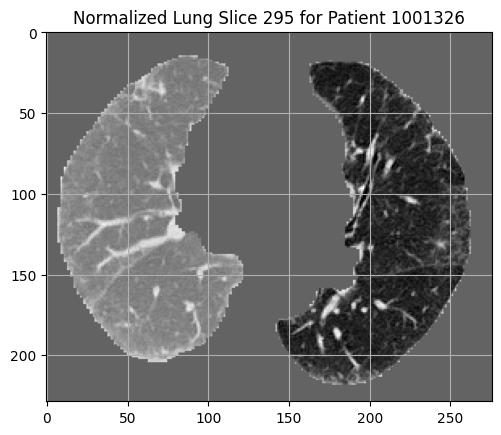

Min value: -1.8686139912822906, Max value: 3.0442555838610144, Mean value: 4.009484961458612e-17


In [28]:
# Test the function on one patient
lung_1001326_normalized = remove_zero_slice_hight_width(1001326, method="zscore")
print(f"Original shape: {nib.load(cases_df[cases_df['PatientID'] == 1001326]['Image'].values[0]).get_fdata().shape}")
print(f"Shape after removing zero slices and normalization: {lung_1001326_normalized.shape}")   
#plot one slice
slice_idx = lung_1001326_normalized.shape[0] // 2
plt.imshow(lung_1001326_normalized[slice_idx, :, :], cmap='gray')
plt.title(f'Normalized Lung Slice {slice_idx} for Patient 1001326')
plt.grid()
plt.show()

print(f"Min value: {lung_1001326_normalized.min()}, Max value: {lung_1001326_normalized.max()}, Mean value: {lung_1001326_normalized.mean()}")

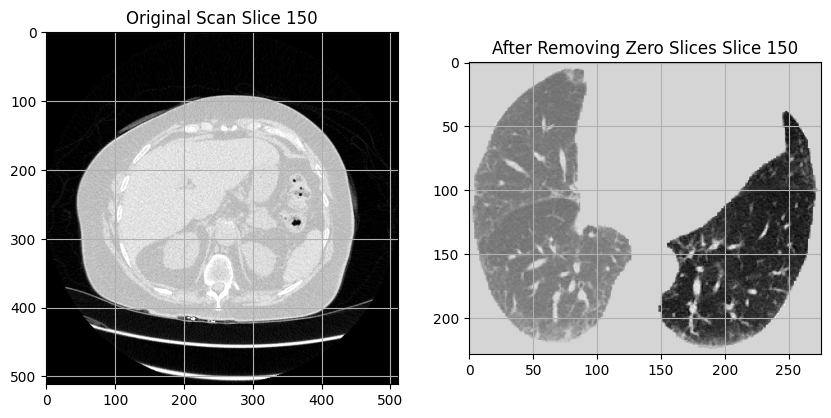

In [29]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(nib.load(cases_df[cases_df['PatientID'] == 1001326]['Image'].values[0]).get_fdata()[150, :, :], cmap='gray')
plt.title('Original Scan Slice 150')
plt.grid()
plt.subplot(1, 2, 2)
plt.imshow(lung_1001326[150, :, :], cmap='gray')
plt.title('After Removing Zero Slices Slice 150')  
plt.grid() 

plt.show()

In [30]:
from skimage.transform import resize


def resize_scan_height_width(scan, new_height=512, new_width=512):
    depth = scan.shape[0]
    width = scan.shape[2]
    height = scan.shape[1]
    if width == new_width and height == new_height:
        return scan
    if width != height:
        # zero pad to make square - pad equally from both sides
        size = max(width, height)
        padded_scan = np.zeros((depth, size, size))
        
        # Calculate padding for height and width
        height_pad = (size - height) // 2
        width_pad = (size - width) // 2
        
        for i in range(depth):
            padded_scan[i, height_pad:height_pad+height, width_pad:width_pad+width] = scan[i]
        resized_scan = np.zeros((depth, new_height, new_width))
        for i in range(depth):
            resized_scan[i] = resize(padded_scan[i], (new_height, new_width), mode='constant', preserve_range=True)
        return resized_scan
    else:
        resized_scan = np.zeros((depth, new_height, new_width))
        for i in range(depth):
            resized_scan[i] = resize(scan[i], (new_height, new_width), mode='constant', preserve_range=True)
        return resized_scan
    

# test the function
resized_lung_1001326 = resize_scan_height_width(lung_1001326, new_height=512, new_width=512)
print(f"Shape after resizing height and width: {resized_lung_1001326.shape}")   

Shape after resizing height and width: (591, 512, 512)


In [31]:
## test on patient 115616
lung_115616 = remove_zero_slice_hight_width(115616)
resized_lung_115616 = resize_scan_height_width(lung_115616, new_height=512, new_width=512)
print(f"Original shape: {nib.load(cases_df[cases_df['PatientID'] == 115616]['Image'].values[0]).get_fdata().shape}")
print(f"Shape after removing zero slices: {lung_115616.shape}")
print(f"Shape after resizing height and width: {resized_lung_115616.shape}")

Original shape: (604, 768, 768)
Shape after removing zero slices: (578, 519, 636)
Shape after resizing height and width: (578, 512, 512)


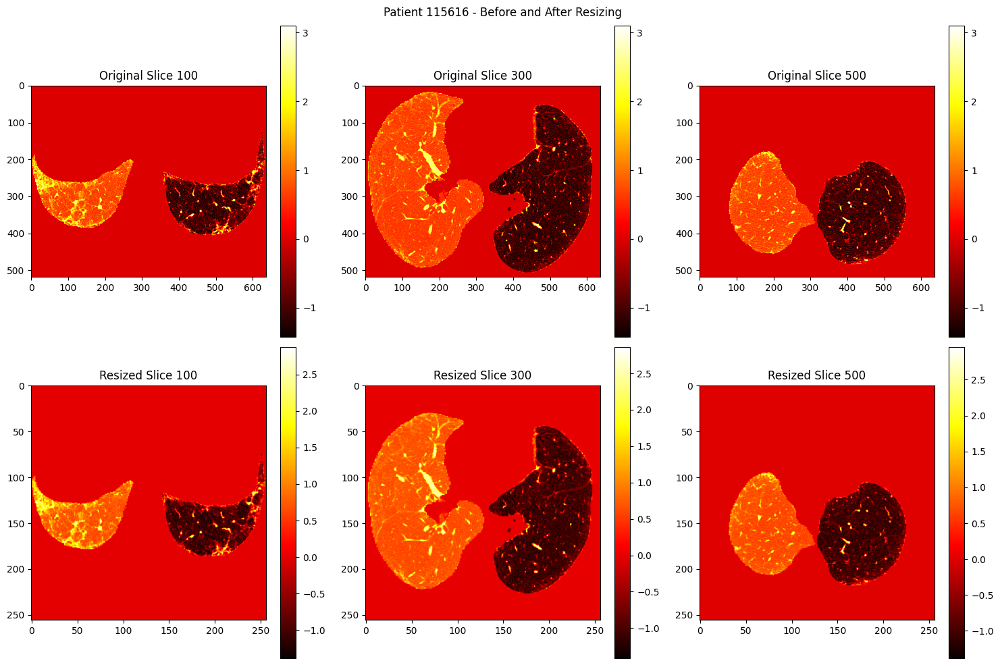

In [32]:
## Plot some slices before and after resizing
def plot_before_after_resizing(patient_id, slice_indices, new_height=256, new_width=256):
    lung_scan = remove_zero_slice_hight_width(patient_id)
    resized_scan = resize_scan_height_width(lung_scan, new_height=new_height, new_width=new_width)
    
    num_slices = len(slice_indices)
    fig, axes = plt.subplots(2, num_slices, figsize=(5 * num_slices, 10))
    
    for i, slice_idx in enumerate(slice_indices):
        im1 = axes[0, i].imshow(lung_scan[slice_idx], cmap='hot')
        axes[0, i].set_title(f'Original Slice {slice_idx}')
        axes[0, i].axis('on')
        plt.colorbar(im1, ax=axes[0, i])
        
        im2 = axes[1, i].imshow(resized_scan[slice_idx], cmap='hot')
        axes[1, i].set_title(f'Resized Slice {slice_idx}')
        axes[1, i].axis('on')
        plt.colorbar(im2, ax=axes[1, i])
    
    plt.suptitle(f'Patient {patient_id} - Before and After Resizing')
    plt.tight_layout()
    plt.show()

plot_before_after_resizing(115616, slice_indices=[100,300,500])

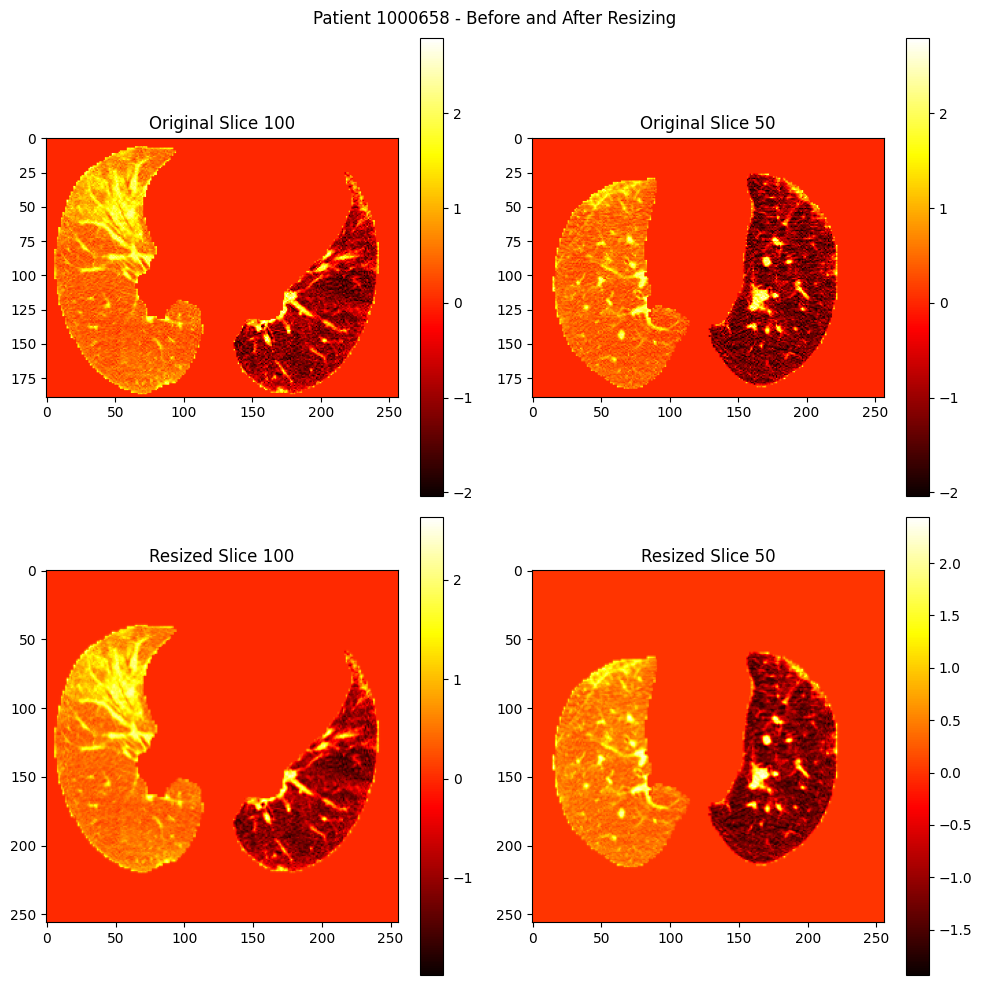

In [33]:
plot_before_after_resizing(1000658,slice_indices=[100,50])

In [34]:
## Now the depth resizing function
def resize_scan_depth(scan, new_depth=400):
    current_depth = scan.shape[0]
    if current_depth == new_depth:
        return scan
    # if current_depth < new_depth:
    #     # zero pad equally at beginning and end
    #     pad_before = (new_depth - current_depth) // 2
    #     pad_after = new_depth - current_depth - pad_before
    #     padded_scan = np.zeros((new_depth, scan.shape[1], scan.shape[2]))
    #     padded_scan[pad_before:pad_before+current_depth, :, :] = scan
    #     return padded_scan
    # # else downsample
    else:
        resized_scan = np.zeros((new_depth, scan.shape[1], scan.shape[2]))
        for i in range(scan.shape[1]):
            for j in range(scan.shape[2]):
                resized_scan[:, i, j] = resize(scan[:, i, j], (new_depth,), mode='constant', preserve_range=True)
        return resized_scan
# test the function
resized_depth_lung_115616 = resize_scan_depth(resized_lung_115616, new_depth=400)
print(f"Shape after resizing depth: {resized_depth_lung_115616.shape}")


Shape after resizing depth: (400, 512, 512)


In [35]:
def plot_rotated_scan(scan, title="", slice=200, rotated=False):
    plt.figure(figsize=(8, 8))
    if rotated == True:
        volume_axial_scan = np.transpose(scan, (1, 2, 0))
        scan = np.flip(volume_axial_scan, axis=0)
    plt.imshow(scan[slice, :, :], cmap='gray')
    plt.title(title)
    plt.axis('on')
    plt.show()

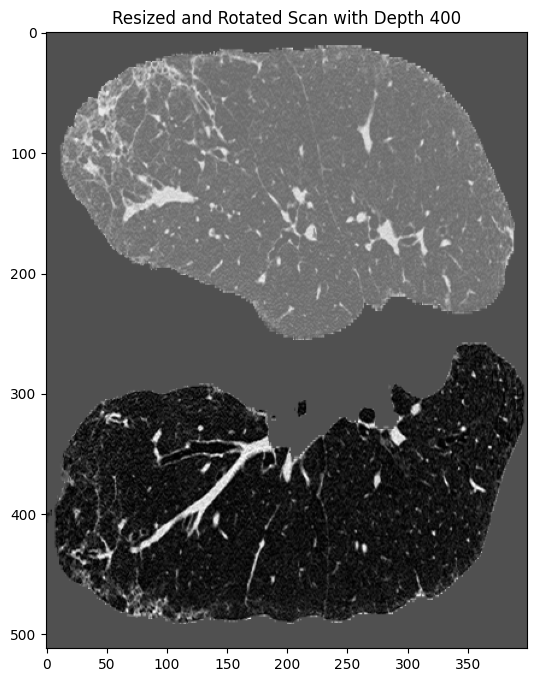

In [36]:
plot_rotated_scan(resized_depth_lung_115616, title="Resized and Rotated Scan with Depth 400", slice=200,rotated=True)

Original shape: (604, 768, 768)
Final processed scan shape: (400, 512, 512)


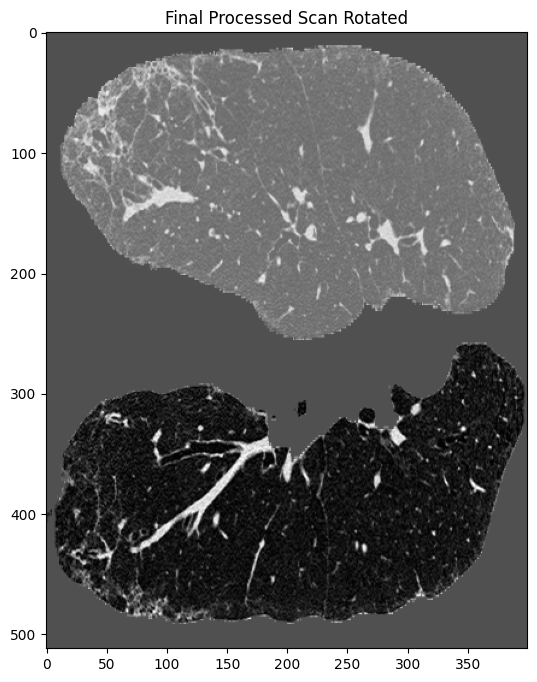

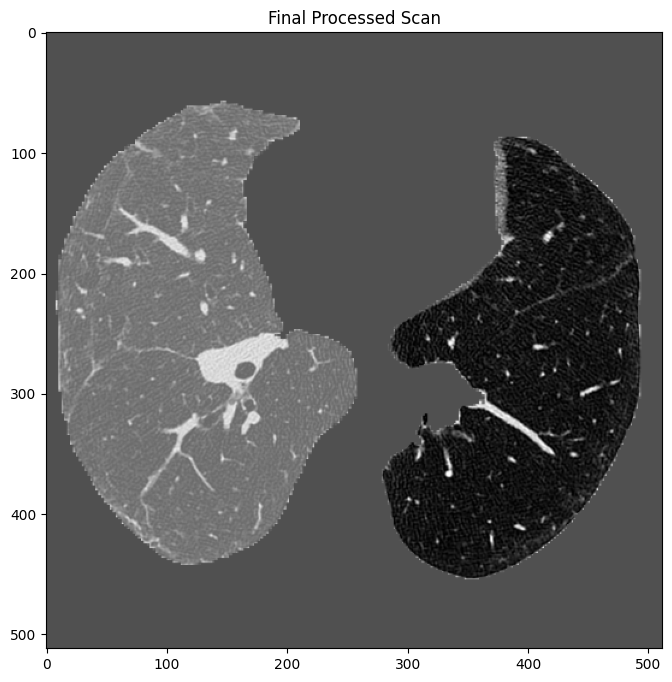

In [37]:
## test the functions all together
def process_full_scan(patient_id, new_height=512, new_width=512, new_depth=400):
    lung_scan = remove_zero_slice_hight_width(patient_id)
    resized_hw_scan = resize_scan_height_width(lung_scan, new_height=new_height, new_width=new_width)
    resized_full_scan = resize_scan_depth(resized_hw_scan, new_depth=new_depth)
    return resized_full_scan
# test on patient 115616
print(f"Original shape: {nib.load(cases_df[cases_df['PatientID'] == 115616]['Image'].values[0]).get_fdata().shape}")
final_scan_115616 = process_full_scan(115616, new_height=512, new_width=512, new_depth=400)
print(f"Final processed scan shape: {final_scan_115616.shape}")
plot_rotated_scan(final_scan_115616, title="Final Processed Scan Rotated", slice = 200, rotated=True)
plot_rotated_scan(final_scan_115616, title="Final Processed Scan", slice=200, rotated=False)

Original shape: (209, 512, 512)
Final processed scan shape: (200, 254, 254)


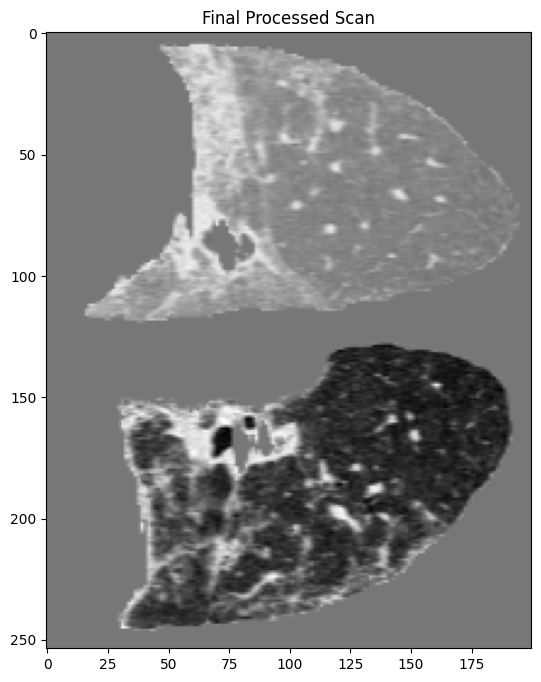

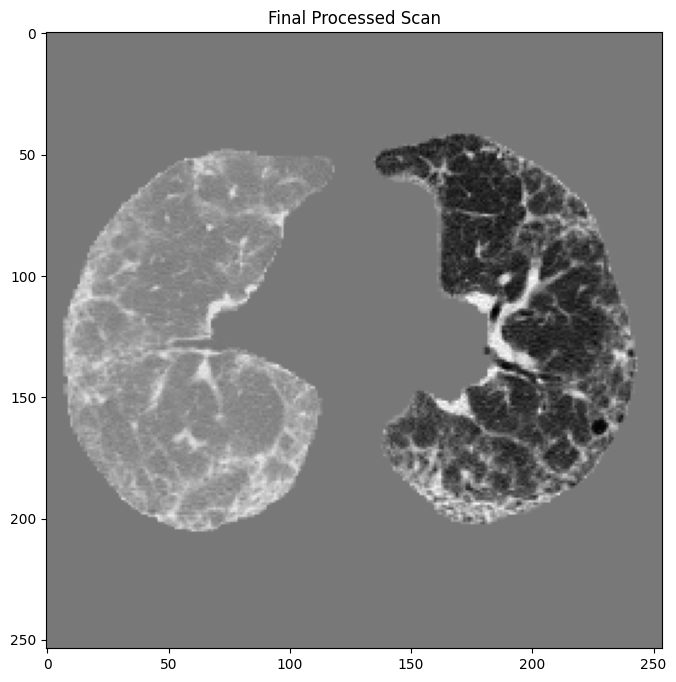

In [38]:
## test the functions all together on patient 1002415 with depth~200
print(f"Original shape: {nib.load(cases_df[cases_df['PatientID'] ==1002415]['Image'].values[0]).get_fdata().shape}")
final_scan_115616 = process_full_scan(1002415,new_height=254, new_width=254, new_depth=200)
print(f"Final processed scan shape: {final_scan_115616.shape}")
plot_rotated_scan(final_scan_115616, title="Final Processed Scan", slice=100, rotated=True)
plot_rotated_scan(final_scan_115616, title="Final Processed Scan", slice=100, rotated=False)

Original shape: (209, 512, 512)
Final processed scan shape: (200, 254, 254)


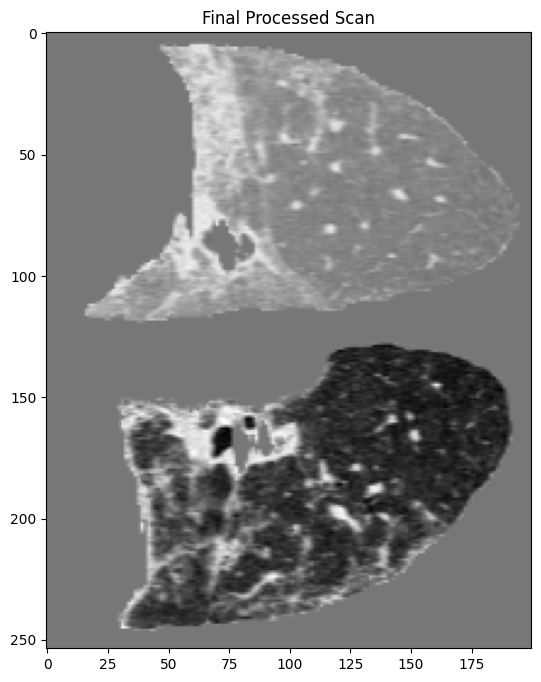

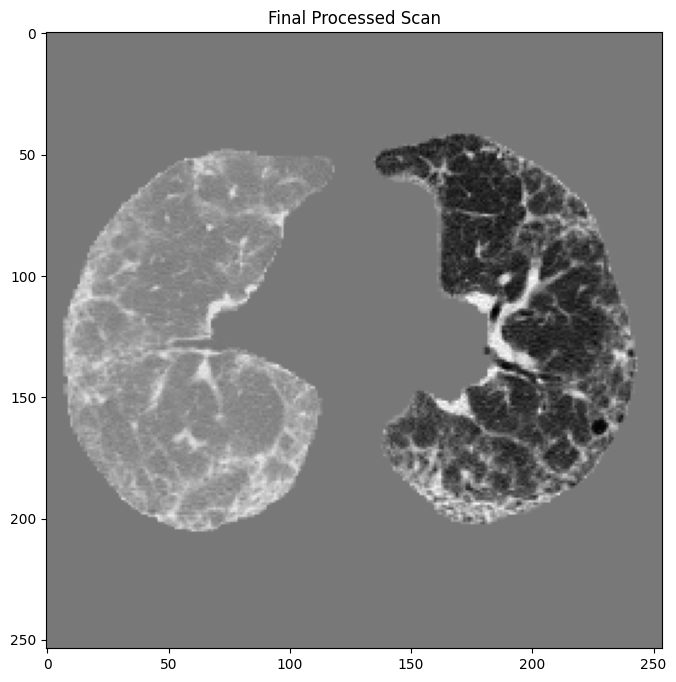

In [39]:
## test the functions all together on patient 1002415 with depth~200
print(f"Original shape: {nib.load(cases_df[cases_df['PatientID'] ==1002415]['Image'].values[0]).get_fdata().shape}")
final_scan_115616 = process_full_scan(1002415,new_height=254, new_width=254, new_depth=200)
print(f"Final processed scan shape: {final_scan_115616.shape}")
plot_rotated_scan(final_scan_115616, title="Final Processed Scan", slice=100, rotated=True)
plot_rotated_scan(final_scan_115616, title="Final Processed Scan", slice=100, rotated=False)

Image shape: (200, 254, 254)
Minimum Pixel Value: -517.1653331991719
Maximum Pixel Value: 630.9626210146082


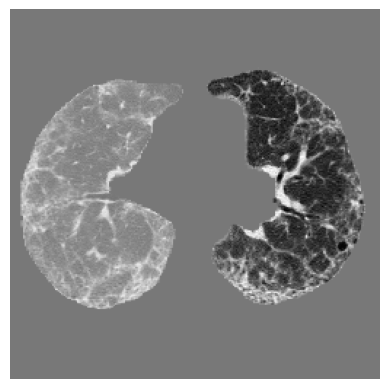

In [40]:
import imageio.v2 as imageio


print("Image shape:", final_scan_115616.shape)
final_scan_115616 = final_scan_115616*255
print("Minimum Pixel Value:", final_scan_115616.min())
print("Maximum Pixel Value:", final_scan_115616.max())

plt.imshow(final_scan_115616[100,:,:], cmap="gray")
plt.axis("off")
plt.show()






## Dataloaders Testting

In [41]:
class FixedSizeDataset(torch.utils.data.Dataset):
    def __init__(self, patient_ids, targets, target_shape=(512, 512, 400)):
        self.patient_ids = patient_ids
        self.targets = targets
        self.target_shape = target_shape
    
    def __getitem__(self, idx):
        # Use process_full_scan instead of preprocess_volume_fixed_size
        volume = process_full_scan(
            self.patient_ids[idx], 
            new_height=self.target_shape[0],
            new_width=self.target_shape[1],
            new_depth=self.target_shape[2]
        )
        
        #Normalization already done in process_full_scan
        
        # Convert to tensor: (C, D, H, W) format for 3D CNNs
        volume_tensor = torch.from_numpy(volume).float()
        volume_tensor = volume_tensor.unsqueeze(0)  # Add channel dimension        
        target = torch.tensor(self.targets[idx]).float()
        
        # Check tensor for NaN
        if torch.any(torch.isnan(volume_tensor)) or torch.any(torch.isnan(target)):
            print(f"Warning: NaN in tensor for patient {self.patient_ids[idx]}")
            volume_tensor = torch.nan_to_num(volume_tensor)
            target = torch.nan_to_num(target)
            
        return volume_tensor, target
    
    def __len__(self):
        return len(self.patient_ids)

In [42]:
# Create sample data for testing the dataloader
sample_patient_ids = cases_df['PatientID'].head(5).tolist()
sample_targets = cases_df['Baseline FVC Predicted %'].head(5).fillna(0).tolist()

# Create dataset instance
test_dataset = FixedSizeDataset(sample_patient_ids, sample_targets, target_shape=(254, 254, 200))

# Create dataloader
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=2, shuffle=False)

# Test loading one batch
print("Testing dataloader...")
for batch_idx, (volumes, targets) in enumerate(test_dataloader):
    print(f"Batch {batch_idx + 1}:")
    print(f"  Volume shape: {volumes.shape}")
    print(f"  Volume dtype: {volumes.dtype}")
    print(f"  Targets shape: {targets.shape}")
    print(f"  Targets: {targets}")
    print(f"  Volume min/max: {volumes.min():.4f} / {volumes.max():.4f}")
    
    if batch_idx == 0:  # Only test first batch
        break

print("Dataloader test completed successfully!")

Testing dataloader...
Batch 1:
  Volume shape: torch.Size([2, 1, 200, 254, 254])
  Volume dtype: torch.float32
  Targets shape: torch.Size([2])
  Targets: tensor([95.7000, 96.7000])
  Volume min/max: -1.8625 / 3.0191
Dataloader test completed successfully!


Volume tensor shape: torch.Size([1, 200, 254, 254])


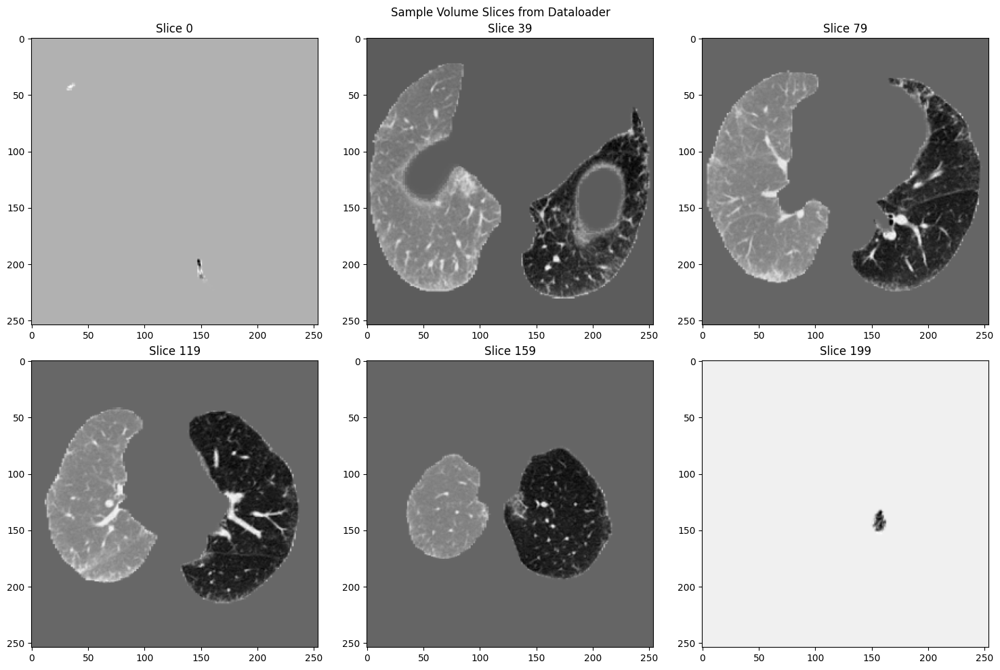

In [43]:
# plot one volume from the dataloader
volume_tensor, target = test_dataset[0]
print(f"Volume tensor shape: {volume_tensor.shape}")
# Squeeze to remove channel dimension for plotting
volume_np = volume_tensor.squeeze(0).numpy()  # Shape: (W, H, D)
# Plot some slices
num_slices_to_plot = 6
slice_indices = np.linspace(0, volume_np.shape[0]-1, num_slices_to_plot, dtype=int)
plt.figure(figsize=(15, 10))
for i, slice_idx in enumerate(slice_indices):
    plt.subplot(2, 3, i+1)
    plt.imshow(volume_np[slice_idx, :, :], cmap='gray')
    plt.title(f'Slice {slice_idx}')
    plt.axis('on')
plt.suptitle('Sample Volume Slices from Dataloader')
plt.tight_layout()
plt.show()

## Check model Summary
Before training the model, it's essential to check the model summary to ensure that the architecture is as expected. This includes verifying the number of layers, parameters, and output shapes at each layer.

In [44]:
import torchvision.models as models  
from acsconv.converters import ACSConverter  

import torch  
import torch.nn as nn  
import torch.optim as optim  

The ``converters`` are currently experimental. It may not support operations including (but not limited to) Functions in ``torch.nn.functional`` that involved data dimension


In [45]:
model = models.resnet18(weights='IMAGENET1K_V1')  
model.conv1 = torch.nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)  
model_3d = ACSConverter(model)  
model_3d.fc = nn.Linear(512, 1) 

In [46]:
# summarize the model
print(model_3d)

ACSConverter(
ResNet(
  (conv1): ACSConv(1, 64, kernel_size=(7, 7, 7), stride=(2, 2, 2), padding=(3, 3, 3), bias=False, acs_kernel_split=(22, 21, 21))
  (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool3d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): ACSConv(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False, acs_kernel_split=(22, 21, 21))
      (bn1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): ACSConv(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False, acs_kernel_split=(22, 21, 21))
      (bn2): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): ACSConv(64, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 

In [47]:
def training_step(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    
    for inputs, targets in dataloader:
        inputs = inputs.to(device)
        targets = targets.to(device).unsqueeze(1)  # Ensure targets shape is (batch_size, 1)
        
        optimizer.zero_grad()
        
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
    
    epoch_loss = running_loss / len(dataloader.dataset)
    return epoch_loss

In [48]:
optimizer = optim.Adam(model_3d.parameters(), lr=0.001)
criterion = nn.MSELoss()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_3d.to(device)
print(f"Using device: {device}")

Using device: cuda


/home/chanutem/OSIC_Analysis/.venv/lib64/python3.9/site-packages/torch/cuda/__init__.py:283: UserWarning: 
    Found GPU0 Quadro P5000 which is of cuda capability 6.1.
    Minimum and Maximum cuda capability supported by this version of PyTorch is
    (7.0) - (12.0)
    
  warnings.warn(
/home/chanutem/OSIC_Analysis/.venv/lib64/python3.9/site-packages/torch/cuda/__init__.py:304: UserWarning: 
    Please install PyTorch with a following CUDA
    configurations:  12.6 following instructions at
    https://pytorch.org/get-started/locally/
    
  warnings.warn(matched_cuda_warn.format(matched_arches))
/home/chanutem/OSIC_Analysis/.venv/lib64/python3.9/site-packages/torch/cuda/__init__.py:283: UserWarning: 
    Found GPU1 Quadro P5000 which is of cuda capability 6.1.
    Minimum and Maximum cuda capability supported by this version of PyTorch is
    (7.0) - (12.0)
    
  warnings.warn(
/home/chanutem/OSIC_Analysis/.venv/lib64/python3.9/site-packages/torch/cuda/__init__.py:326: UserWarning: 

In [49]:

print(f"Optimizer: {optimizer}")
print(f"Loss Function: {criterion}")

Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0
)
Loss Function: MSELoss()


In [50]:
import torch
for i in range(torch.cuda.device_count()):
   print(torch.cuda.get_device_properties(i).name)

Quadro P5000
Quadro P5000


In [51]:
%pip install acsconv

# Check CUDA compatibility and fallback to CPU if needed
try:
	# Test if the model works on GPU
	test_input = torch.randn(1, 1, 32, 32, 32).to(device)
	with torch.no_grad():
		_ = model_3d(test_input)
	print(f"Model successfully runs on {device}")
except Exception as e:
	print(f"GPU error: {e}")
	print("Falling back to CPU...")
	device = torch.device("cpu")
	model_3d.to(device)
	print(f"Model moved to {device}")

# test one training step on 10 images
sample_patient_ids = cases_df['PatientID'].head(5).tolist()
sample_targets = cases_df['Baseline FVC Predicted %'].head(10).fillna(0).tolist()
train_dataset = FixedSizeDataset(sample_patient_ids, sample_targets, target_shape=(254, 254, 200))
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=2, shuffle=True)
train_loss = training_step(model_3d, train_dataloader, criterion, optimizer, device)
print(f"Training loss on sample batch: {train_loss:.4f}")


Note: you may need to restart the kernel to use updated packages.
GPU error: CUDA error: no kernel image is available for execution on the device
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.

Falling back to CPU...
Model moved to cpu
Training loss on sample batch: 7285.2207
